## [Asset Price Prediction with ML: Data Management](https://alphascientist.com/)

In this first notebook, I will present a framework for organizing and working with data. Perhaps not the most electrifying of topics, but it's a precondition for comprehending later modeling tutorials.

It's also, as any practitioner of the field will agree, of critical significance and importance. I've heard it said that 90% of time in real-world quant finance is spent on data rather than models. That may be a bit of an exaggeration, but not far off.

Following a coherent data management schema (mine or otherwise) will save countless hours of frustration and will allow you to scale your projects to teams of contributors

### Types of Data Structures
***My system for handling data makes heavy use of three main types of data collections:***

**-** **features:** This is a dataframe which contains all features or values which we will allow models to use in the course of learning relationships - and later making predictions. All features must be values which would have been known **at the point in time when the model needed to make predictions.**

In other words, **next_12_months_returns** would be a bad feature since it would not become known at the time needed. The **features dataframe** has a multi-index of date/symbol and column names unique to each feature. More on this later.

**-** **outcomes:** This is a dataframe of all possible future outcomes which we may be interested in predicting, magically shifted back in time to T-zero. For instance, we may want to predict the total_return for a symbol over the year following T=0 (the time of prediction). We would look ahead into the future, calculate what ultimately did happen to this metric, and log it onto time T=0. I'll explain why in a minute.

Just like **features**, this dataframe has rows indexed by date/symbol and columns named with a convention which describes the feature.

**-** **master:** The final data structure type is the master dataframe. This contains any static information about each symbol in the universe, such as the SIC code, the number of shares outstanding, beta factors, etc...

In practice, things in the **master** may change over time (SIC codes and shares out can both change...) but I've found it sufficient for my purposes to take the current static values for the current point in time.

This dataframe uses row index of symbol only. You could, of course, add a date/symbol index if you wanted to reflect changing values over time.

### Why this data scheme?

It may seem odd to split the features and outcomes into distinct dataframes, and odd to create a dataframe of several different possible "outcomes". Most important, it may seem odd to record on t=0 what will happen in the next day, week, month, etc...

There are several reasons for this approach:

**1.** This makes it trivial to extract the X's and y's when training models. Just slice some columns from features for the X and slice one column of outcomes in y. They're already aligned and ready for fitting.

**2.** This makes it trivial to toggle between various time horizons - just change the column of outcomes used for y.

**3.** This helps us guard against inadvertent "peeking" at the future. We only ever use features columns in X.

**4.** This allows us to use the incredibly efficient pandas join, merge, and concat methods to quickly align data for purposes of training models.

Trust me. This will save you many, many hours of debugging and brute force coding down the road.

### An example

Let's create simple toy examples of each dataframe using free data from quandl:

First, we'll make a utility function which downloads one or more symbols from quandl and returns the adjusted OHLC data (I generally find adjusted data to be best).

## Imports

In [99]:
from __future__ import division
from binance.client import Client
from BinanceKeys import BinanceKey1
import numpy as np
import pandas as pd
pd.core.common.is_list_like = pd.api.types.is_list_like # may be necessary in some versions of pandas
import pandas_datareader.data as web
import seaborn as sns
import time
import dateparser
from datetime import timedelta, datetime
from dateutil import parser
import pytz
import json
import matplotlib
import matplotlib.pyplot as plt
matplotlib.style.use("ggplot")
from binance.enums import *
import pprint
import math
import os.path
import requests
import warnings
warnings.filterwarnings('ignore')

In [2]:
api_key = BinanceKey1['api_key']
api_secret = BinanceKey1['api_secret']
client = Client(api_key, api_secret)

In [3]:
### CONSTANTS
binsizes = {"1m": 1, "5m": 5, "1h": 60, "12h": 720, "1d": 1440}
batch_size = 750
binance_client = client

In [4]:
### FUNCTIONS
def minutes_of_new_data(symbol, kline_size, data, source):
    
    if len(data) > 0:  old = parser.parse(data["timestamp"].iloc[-1])
    #elif source == "binance": old = datetime.strptime('15 Aug 2017', '%d %b %Y')
    elif source == "binance": old = datetime.strptime('13 Dec 2017', '%d %b %Y')
    if source == "binance": new = pd.to_datetime(binance_client.get_klines(symbol=symbol, interval=kline_size)[-1][0], unit='ms')
    return old, new

# Massage OHLCV data into Heiken Ashi candles
def Heiken_Ashi(dataframe):
    
    df = dataframe.copy()
    df.open = df.open.astype(float)
    df.high = df.high.astype(float)
    df.low = df.low.astype(float)
    df.close = df.close.astype(float)
    
    df['HA_Close']=(df.open + df.high + df.low + df.close)/4
    df.reset_index(inplace=True)
    ha_open = [ (df.open[0] + df.close[0]) / 2 ]
    [ ha_open.append((ha_open[i] + df.HA_Close.values[i]) / 2) \
    for i in range(0, len(df)-1) ]
    df['HA_Open'] = ha_open
    df['HA_High']=df[['HA_Open','HA_Close','high']].max(axis=1)
    df['HA_Low']=df[['HA_Open','HA_Close','low']].min(axis=1)
    
    return df

In [5]:
def get_all_binance(symbol, kline_size, save = False):
    
    filename = '%s_%s_%s_HK_data' % (symbol, kline_size, str(datetime.now().strftime('%Y_%m_%d')))
    if os.path.isfile(filename): data_df = pd.read_csv(filename)
    else: data_df = pd.DataFrame()
    oldest_point, newest_point = minutes_of_new_data(symbol, kline_size, data_df, source = "binance")
    delta_min = (newest_point - oldest_point).total_seconds()/60
    available_data = math.ceil(delta_min/binsizes[kline_size])
    if oldest_point == datetime.strptime('13 Dec 2017', '%d %b %Y'): print('Downloading all available %s data for %s. Be patient..!' % (kline_size, symbol))
    #if oldest_point == datetime.strptime('17 Nov 2017', '%d %b %Y'): print('Downloading all available %s data for %s. Be patient..!' % (kline_size, symbol))
    else: print('Downloading %d minutes of new data available for %s, i.e. %d instances of %s data.' % (delta_min, symbol, available_data, kline_size))
    klines = binance_client.get_historical_klines(symbol, kline_size, oldest_point.strftime("%d %b %Y %H:%M:%S"), newest_point.strftime("%d %b %Y %H:%M:%S"))
    
    data = pd.DataFrame(klines, columns = ['timestamp', 'open', 'high', 'low', 'close', 'volume', 'close_time', 'quote_av', 'trades', 'tb_base_av', 'tb_quote_av', 'ignore' ])
    data = data.drop(['ignore','close_time', 'quote_av', 'trades', 'tb_base_av', 'tb_quote_av'], axis=1)
    data['timestamp'] = pd.to_datetime(data['timestamp'], unit='ms')
    
    HA_DF = Heiken_Ashi(data)
    HA_DFx = HA_DF[["HA_Open", "HA_High", "HA_Low", "HA_Close"]]
    HA_DFx.columns = ['open','high','low','close']
    HA_DFx['volume'] = data['volume']
    HA_DFx['timestamp'] = data['timestamp']
    data = HA_DFx
    
    TS = data['timestamp'] 
    if len(data_df) > 0:
        temp_df = pd.DataFrame(data)
        data_df = data_df.append(temp_df)
    else: data_df = data
    if save: print('saving...')
    print('All caught up..!')
    return data_df

### Download Binance  Crypto Prices

In [6]:
#for symbol in list_of_symbols:
data_df = get_all_binance('BTCUSDT', '1d', save = False)
ETHUSDT = get_all_binance('ETHUSDT', '1d', save = False)

All caught up..!
All caught up..!


In [7]:
cols = ['open', 'high', 'low', 'close', 'volume', 'timestamp']

data_df.columns = cols
data_df['timestamp'] = pd.to_datetime(data_df['timestamp'], unit='ms')
data_df['Open'] = data_df['open'] 
data_df.index = data_df.timestamp
data_df.sort_index(inplace=True)
data_df['symbol'] = 'BTCUSDT'
data_df = data_df.set_index(['timestamp','symbol'])

ETHUSDT.columns = cols
ETHUSDT['timestamp'] = pd.to_datetime(ETHUSDT['timestamp'], unit='ms')
ETHUSDT['Open'] = ETHUSDT['open'] 
ETHUSDT.index = ETHUSDT.timestamp
ETHUSDT.sort_index(inplace=True)
ETHUSDT['symbol'] = 'ETHUSDT'
ETHUSDT = ETHUSDT.set_index(['timestamp','symbol'])

In [8]:
ETHUSDT.head()

,,open,high,low,close,volume,Open
timestamp,symbol,,,,,,
2017-12-13,ETHUSDT,652.995000,705.69,539.930000,637.9025,57694.18773000,652.995000
2017-12-14,ETHUSDT,645.448750,747.60,630.500000,685.4600,60919.26902000,645.448750
2017-12-15,ETHUSDT,665.454375,689.00,594.600000,659.5775,39778.16165000,665.454375
2017-12-16,ETHUSDT,662.515938,712.00,662.515938,684.4450,26866.05330000,662.515938
2017-12-17,ETHUSDT,673.480469,728.00,673.480469,699.4425,31398.44760000,673.480469


### ML Feature dataframe fromat

In [9]:
out = pd.concat([data_df,ETHUSDT],axis=0) #stacks on top of previously collected data
out = out.sort_index()
out.head()

open      high       low       close  \
timestamp  symbol                                                 
2017-12-13 BTCUSDT  16191.64000  16546.00  14666.56  15898.9600   
           ETHUSDT    652.99500    705.69    539.93    637.9025   
2017-12-14 BTCUSDT  16045.30000  16445.00  15450.00  16065.0800   
           ETHUSDT    645.44875    747.60    630.50    685.4600   
2017-12-15 BTCUSDT  16055.19000  17991.00  16055.19  17041.0650   

                            volume         Open  
timestamp  symbol                                
2017-12-13 BTCUSDT  12416.32880100  16191.64000  
           ETHUSDT  57694.18773000    652.99500  
2017-12-14 BTCUSDT  11616.86715100  16045.30000  
           ETHUSDT  60919.26902000    645.44875  
2017-12-15 BTCUSDT   9181.27394700  16055.19000

### Aplhalens factor analysis dataframe fromat

In [10]:
data_df.columns =[data_df.columns[0]]+['bt_'+i for i in data_df.columns[1:]]
ETHUSDT.columns =[ETHUSDT.columns[0]]+['eth_'+i for i in ETHUSDT.columns[1:]]

data_df = data_df.drop('open', axis=1)
ETHUSDT = ETHUSDT.drop('open', axis=1)

market_info = pd.merge(data_df,ETHUSDT, on=['timestamp'])

for coins in ['bt_', 'eth_']: 
    kwargs = { coins+'day_diff': lambda x: (x[coins+'close']-x[coins+'Open'])/x[coins+'Open']}
    market_info = market_info.assign(**kwargs)

market_info.head()

,bt_high,bt_low,bt_close,bt_volume,bt_Open,eth_high,eth_low,eth_close,eth_volume,eth_Open,bt_day_diff,eth_day_diff
timestamp,,,,,,,,,,,,
2017-12-13,16546.00,14666.56000,15898.9600,12416.32880100,16191.64000,705.69,539.930000,637.9025,57694.18773000,652.995000,-0.018076,-0.023113
2017-12-14,16445.00,15450.00000,16065.0800,11616.86715100,16045.30000,747.60,630.500000,685.4600,60919.26902000,645.448750,0.001233,0.061990
2017-12-15,17991.00,16055.19000,17041.0650,9181.27394700,16055.19000,689.00,594.600000,659.5775,39778.16165000,665.454375,0.061405,-0.008831
2017-12-16,19539.00,16548.12750,18337.1200,4202.62870900,16548.12750,712.00,662.515938,684.4450,26866.05330000,662.515938,0.108108,0.033100
2017-12-17,19798.68,17442.62375,19072.2225,9177.18343400,17442.62375,728.00,673.480469,699.4425,31398.44760000,673.480469,0.093426,0.038549


In [11]:
%pylab inline --no-import-all
import alphalens
import pyfolio

Populating the interactive namespace from numpy and matplotlib


In [12]:
pricing = market_info[['bt_Open', 'bt_close', 'eth_Open', 'eth_close']]
pricing.index = pricing.index.tz_localize('UTC')

In [13]:
pricing.tail()

,bt_Open,bt_close,eth_Open,eth_close
timestamp,,,,
2019-11-26 00:00:00+00:00,7130.954086,7155.9025,146.656059,146.6550
2019-11-27 00:00:00+00:00,7143.428293,7289.5675,146.655529,149.1175
2019-11-28 00:00:00+00:00,7216.497897,7482.5975,147.886515,151.7625
2019-11-29 00:00:00+00:00,7349.547698,7592.6250,149.824507,153.2725
2019-11-30 00:00:00+00:00,7471.086349,7744.7675,151.548504,154.5050


In [14]:
non_predictive_factor = pricing.pct_change(10)
non_predictive_factor = non_predictive_factor.stack()
non_predictive_factor.index = non_predictive_factor.index.set_names(['date', 'asset'])

In [15]:
non_predictive_factor.tail()

date                       asset    
2019-11-29 00:00:00+00:00  eth_close   -0.130751
2019-11-30 00:00:00+00:00  bt_Open     -0.097620
                           bt_close    -0.047810
                           eth_Open    -0.153231
                           eth_close   -0.119077
dtype: float64

In [16]:
non_predictive_factor_data = alphalens.utils.get_clean_factor_and_forward_returns(non_predictive_factor, 
                                                                                  pricing, 
                                                                                  quantiles=4,
                                                                                  bins=None)

Dropped 1.4% entries from factor data: 1.4% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


In [18]:
factor = non_predictive_factor.unstack()
factor.index = factor.index.tz_convert('UTC')
factor = factor.stack()

In [19]:
factor.head()

date                       asset    
2017-12-23 00:00:00+00:00  bt_Open     -0.059381
                           bt_close    -0.142164
                           eth_Open     0.111494
                           eth_close    0.026195
2017-12-24 00:00:00+00:00  bt_Open     -0.100395
dtype: float64

In [20]:
factor_data = alphalens.utils.get_clean_factor_and_forward_returns(factor,
                                                                   pricing,
                                                                   periods=(1, 3, 5),
                                                                   quantiles=5,
                                                                   bins=None)

Dropped 0.7% entries from factor data: 0.7% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


In [21]:
factor_data.head()

1D        3D        5D    factor  \
date                      asset                                               
2017-12-23 00:00:00+00:00 bt_Open   -0.052247 -0.103701 -0.026148 -0.059381   
                          bt_close  -0.042064  0.080956  0.069238 -0.142164   
                          eth_Open  -0.049041 -0.076281 -0.009226  0.111494   
                          eth_close -0.033986  0.117333  0.084073  0.026195   
2017-12-24 00:00:00+00:00 bt_Open   -0.047436 -0.016462  0.018916 -0.100395   

                                     factor_quantile  
date                      asset                       
2017-12-23 00:00:00+00:00 bt_Open                  2  
                          bt_close                 1  
                          eth_Open                 5  
                          eth_close                4  
2017-12-24 00:00:00+00:00 bt_Open                  2

In [22]:
factor_data['1D'].head()

date                       asset    
2017-12-23 00:00:00+00:00  bt_Open     -0.052247
                           bt_close    -0.042064
                           eth_Open    -0.049041
                           eth_close   -0.033986
2017-12-24 00:00:00+00:00  bt_Open     -0.047436
Name: 1D, dtype: float64

In [23]:
bmark = pricing[pricing.index >= '2017-12-23 00:00:00+00:00']
bmark = bmark.bt_close

In [24]:
factor = pd.DataFrame(factor_data['1D'])
factor.reset_index(level=['asset'], inplace=True)
del factor['asset']
factor['bmark'] = bmark
factor = factor.ffill(axis=1)
factor.columns = ['_1D','bmark']

In [25]:
factor.head()

,_1D,bmark
date,,
2017-12-23 00:00:00+00:00,-0.052247,13638.6975
2017-12-23 00:00:00+00:00,-0.042064,13638.6975
2017-12-23 00:00:00+00:00,-0.049041,13638.6975
2017-12-23 00:00:00+00:00,-0.033986,13638.6975
2017-12-24 00:00:00+00:00,-0.047436,13064.9975


In [26]:
factor.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2812 entries, 2017-12-23 00:00:00+00:00 to 2019-11-25 00:00:00+00:00
Data columns (total 2 columns):
_1D      2812 non-null float64
bmark    2812 non-null float64
dtypes: float64(2)
memory usage: 145.9 KB


In [27]:
new_index = pd.date_range("2017-12-23", periods=len(factor), freq="D")
factor.index = new_index

In [28]:
factor.head()

,_1D,bmark
2017-12-23,-0.052247,13638.6975
2017-12-24,-0.042064,13638.6975
2017-12-25,-0.049041,13638.6975
2017-12-26,-0.033986,13638.6975
2017-12-27,-0.047436,13064.9975


Start date,2017-12-23
End date,2025-09-03
Total months,133
,Backtest
Annual return,-33.2%
Cumulative returns,-98.9%
Annual volatility,46.9%
Sharpe ratio,-0.62
Calmar ratio,-0.33
Stability,0.31
Max drawdown,-100.0%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,99.98,2018-03-23,2021-11-22,NaT,NaN
1,25.67,2018-01-08,2018-01-24,2018-02-02,20
2,17.70,2018-03-04,2018-03-13,2018-03-20,12
3,16.69,2017-12-23,2017-12-29,2018-01-03,8
4,8.61,2018-02-21,2018-02-22,2018-02-24,3


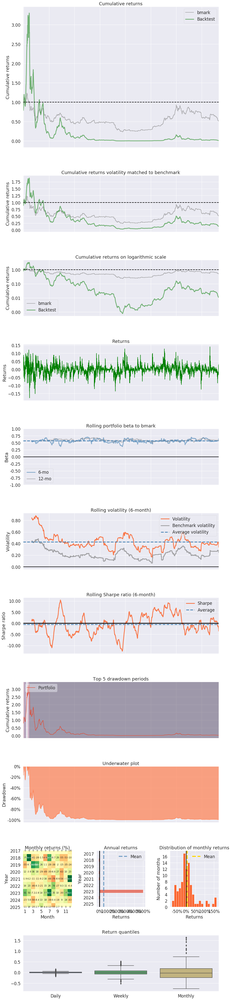

In [29]:
pyfolio.create_returns_tear_sheet(factor._1D, benchmark_rets=factor.bmark.pct_change())

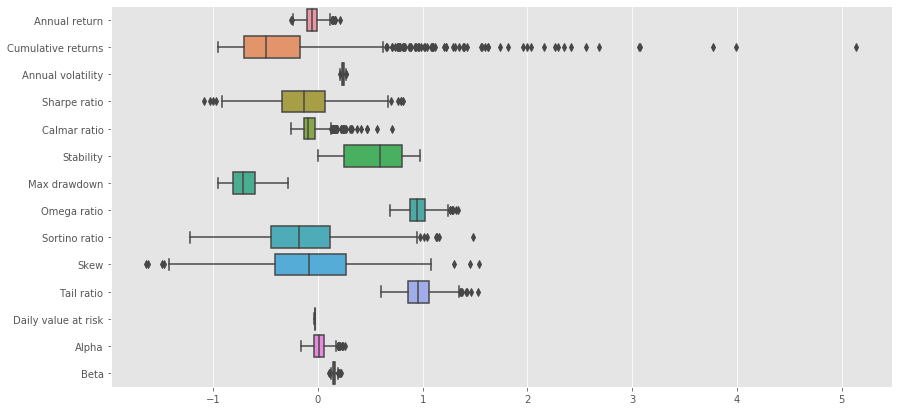

In [30]:
plt.figure(figsize=(14, 7))
pyfolio.plot_perf_stats(factor_returns=factor._1D, returns=factor.bmark.pct_change())
plt.show();

### Download Yahoo Stock Prices

First, we'll make a utility function which downloads one or more symbols from quandl and returns the adjusted OHLC data (I generally find adjusted data to be best).

In [31]:
def get_symbols(symbols,data_source, begin_date=None,end_date=None):
    
    out = pd.DataFrame()
    
    for symbol in symbols:
        df = web.DataReader(symbol, data_source,begin_date, end_date)\
        [['High','Low','Open','Close','Volume','Adj Close']].reset_index()
        #df.columns = ['High','Low','Open','Close','Volume','Adj Close'] #my convention: always lowercase
        df['symbol'] = symbol # add a new column which contains the symbol so we can keep multiple symbols in the same dataframe
        df = df.set_index(['Date','symbol'])
        out = pd.concat([out,df],axis=0) #stacks on top of previously collected data
        
    return out.sort_index()

### Sample Period

In [32]:
start = pd.Timestamp("2015-01-01") 
end = pd.Timestamp("2017-01-01")

In [33]:
prices = get_symbols(['AAPL','CSCO'],data_source='yahoo',\
                     begin_date=start,end_date=end)

In [34]:
prices.head()

High         Low        Open       Close      Volume  \
Date       symbol                                                               
2015-01-02 AAPL    111.440002  107.349998  111.389999  109.330002  53204600.0   
           CSCO     28.120001   27.379999   27.860001   27.610001  22926500.0   
2015-01-05 AAPL    108.650002  105.410004  108.290001  106.250000  64285500.0   
           CSCO     27.450001   27.000000   27.320000   27.059999  29460600.0   
2015-01-06 AAPL    107.430000  104.629997  106.540001  106.260002  65797100.0   

                    Adj Close  
Date       symbol              
2015-01-02 AAPL    100.454300  
           CSCO     23.754028  
2015-01-05 AAPL     97.624336  
           CSCO     23.280836  
2015-01-06 AAPL     97.633545

### Creating Features
Now, we will create some toy features. If the syntax is unclear, I'll cover that in more depth in the next post. For now, just note that we've created five features for both symbols using only data that would be available as of the end of day T.

Also note that I've dropped any rows which contain any nulls for simplicity, since scikit-learn can't handle those out of the box.

In [35]:
features = pd.DataFrame(index=prices.index)
features['volume_change_ratio'] = prices.groupby(level='symbol').Volume\
.diff(1) / prices.groupby(level='symbol').shift(1).Volume
features['momentum_5_day'] = prices.groupby(level='symbol').Close\
.pct_change(5) 

features['intraday_chg'] = (prices.groupby(level='symbol').Close\
                            .shift(0) - prices.groupby(level='symbol').Open\
                            .shift(0))/prices.groupby(level='symbol').Open.shift(0)

features['day_of_week'] = features.index.get_level_values('Date').weekday

features['day_of_month'] = features.index.get_level_values('Date').day

features.dropna(inplace=True)

features.tail(10)

volume_change_ratio  momentum_5_day  intraday_chg  \
Date       symbol                                                      
2016-12-23 AAPL              -0.453747        0.004743      0.008046   
           CSCO              -0.291308       -0.001961     -0.000327   
2016-12-27 AAPL               0.284038        0.005316      0.006351   
           CSCO               0.546278       -0.002276      0.001306   
2016-12-28 AAPL               0.142592       -0.001625     -0.006467   
           CSCO              -0.151903       -0.004581     -0.009121   
2016-12-29 AAPL              -0.280610       -0.002819      0.002405   
           CSCO              -0.085392        0.001315      0.002963   
2016-12-30 AAPL               1.033731       -0.004042     -0.007115   
           CSCO               0.836189       -0.007879     -0.011126   

                   day_of_week  day_of_month  
Date       symbol                             
2016-12-23 AAPL              4            23  
           CSCO              4            23  
2016-12-27 AAPL              1            27  
           CSCO              1            27  
2016-12-28 AAPL              2            28  
           CSCO              2            28  
2016-12-29 AAPL              3            29  
           CSCO              3            29  
2016-12-30 AAPL              4            30  
           CSCO              4            30

Next, we'll create outcomes. Note that the seemingly unnecessary lambda function is needed because of this issue with pandas

In [36]:
outcomes = pd.DataFrame(index=prices.index)
# next day's opening change
outcomes['open_1'] = prices.groupby(level='symbol').Open.shift(-1)\
/prices.groupby(level='symbol').Close.shift(0)-1
# next day's closing change
func_one_day_ahead = lambda x: x.pct_change(-1)
outcomes['close_1'] = prices.groupby(level='symbol').Close\
.apply(func_one_day_ahead)
func_five_day_ahead = lambda x: x.pct_change(-5)
outcomes['close_5'] = prices.groupby(level='symbol').Close\
.apply(func_five_day_ahead)

outcomes.tail(15)

open_1   close_1   close_5
Date       symbol                              
2016-12-20 CSCO    0.004254  0.004602  0.004602
2016-12-21 AAPL   -0.006065  0.006621  0.002827
           CSCO   -0.000657 -0.001313 -0.001313
2016-12-22 AAPL   -0.006019 -0.001974  0.004058
           CSCO    0.002626 -0.002293  0.007942
2016-12-23 AAPL    0.000000 -0.006311       NaN
           CSCO    0.003603 -0.004889       NaN
2016-12-27 AAPL    0.002217  0.004282       NaN
           CSCO    0.000652  0.008547       NaN
2016-12-28 AAPL   -0.002655  0.000257       NaN
           CSCO   -0.001644 -0.001313       NaN
2016-12-29 AAPL   -0.000685  0.007857       NaN
           CSCO    0.003283  0.007942       NaN
2016-12-30 AAPL         NaN       NaN       NaN
           CSCO         NaN       NaN       NaN

Note that the shifted periods are negative, which in pandas convention looks ahead in time. This means that at the ending of our time period we will have nulls - and more nulls in the outcome colums that need to look further into the future. We don't dropna() here since we may want to use **open_1** and there's no reason to throw away data from that column just because a different outcome didn't have data. But I digress.

Now, to put it together, we'll train a simple linear model in **scikit-learn**, using all features to predict **close_1**

In [37]:
# a valid value exists for both y and X
y = outcomes.close_1
X = features
Xy = X.join(y).dropna()
y = Xy[y.name]
X = Xy[X.columns]
print(y.shape)
print(X.shape)

(996,)
(996, 5)


Note that all of these slightly tedious steps have left us with properly sized, identically indexed data objects. At this point, the modeling is dead simple:

In [38]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X,y)
print(" ")
print("Model RSQ: "+ str(model.score(X,y)))
print(" ")
print("Coefficients: ")
print(" ")
print(pd.Series(model.coef_,index=X.columns).sort_values(ascending=False))

 
Model RSQ: 0.016778503121131272
 
Coefficients: 
 
intraday_chg           0.156183
volume_change_ratio    0.001084
day_of_month           0.000034
day_of_week           -0.000404
momentum_5_day        -0.006018
dtype: float64


Clearly, this model isn't very useful but illustrates the workflow.

If we wanted to instead try a random forest to predict tomorrow's open, it'd be mostly copy-paste:

(996,)
(996, 5)
 


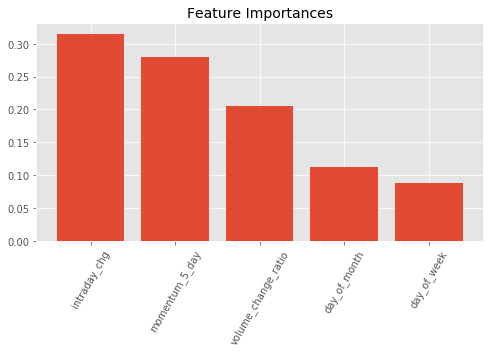

 
Model Score (RSQ): 0.8314077103846788
 
Feature Importance: 
 
intraday_chg           0.315183
momentum_5_day         0.279176
volume_change_ratio    0.204775
day_of_month           0.112266
day_of_week            0.088600
dtype: float64


In [39]:
from sklearn.ensemble import RandomForestRegressor

y = outcomes.open_1
X = features
Xy = X.join(y).dropna()
y = Xy[y.name]
X = Xy[X.columns]
print(y.shape)
print(X.shape)
print(" ")

model = RandomForestRegressor(max_features=3)
model.fit(X,y)

# Get feature importances from our random forest model
importances = model.feature_importances_

# Get the index of importances from greatest importance to least
sorted_index = np.argsort(importances)[::-1]
x = range(len(importances))

feature_names = features.columns

# Create tick labels 
labels = np.array(feature_names)[sorted_index]
plt.figure(figsize=(8, 4))
plt.bar(x, importances[sorted_index], tick_label=labels)

# Rotate tick labels to vertical
plt.xticks(rotation=60)
plt.title('Feature Importances', size=14)
plt.show();

print(" ")
print("Model Score (RSQ): "+ str(model.score(X,y)))
print(" ")
print("Feature Importance: ")
print(" ")
print(pd.Series(model.feature_importances_,index=X.columns)\
.sort_values(ascending=False))

This yields a vastly improved RSQ but note that it is almost certainly ridiculously overfitted, as random forests are prone to do.

We'll cover ways to systematically avoid allowing the model to overfit in future posts, but that requires going a bit further down the rabbit hole.

Side note: in this example (and often, in real life) we've mixed together all observations from AAPL and CSCO into one dataset. We could have alternatively trained two different models for the two symbols, which may have achieved better fit, but almost certainly at the cost of worse generalization out of sample. The bias-variance trade-off in action!

### Prediction
Once the model is trained, it becomes a one-liner to make predictions from a set of feature values. In this case, we'll simply feed the same X values used to train the model, but in live usage, of course, we'd want to apply the trained model to new X values.

In [40]:
print(pd.Series(model.predict(X),index=X.index).tail(10))

Date        symbol
2016-12-22  AAPL     -0.004934
            CSCO      0.000523
2016-12-23  AAPL     -0.002447
            CSCO      0.001543
2016-12-27  AAPL     -0.000276
            CSCO     -0.001372
2016-12-28  AAPL     -0.002019
            CSCO     -0.002308
2016-12-29  AAPL      0.000170
            CSCO      0.002396
dtype: float64


Let me pause here to emphasize the most critical point to understand about this framework. Read this twice!

The date of a feature row represents the day when a value would be known after that day's trading, using the feature value date as T=0. The date of an outcome row represents what will happen in the n days following that date.

**Predictions are indexed to the date of the evening when the model could have been run.** In other words, the prediction indexed to 2016-12-23 represents what the model believes will happen in some time period after 12/23. In practical usage, we can't start using the trading signal until T+1 (since predictions are generated after markets are closed on T+0).

### Summary
This post presented the concept of organizing data into a features dataframe and outcome dataframe, and then showed how simple it is to join these two dataframes together to train a model.

True, the convention may take a few examples to get used to. However, after trial and error, I've found this to be the most error-resistant, flexible, and high-performance way to go.

## Feature Engineering

With the data collected, we can create a new dataframe called "features" which will be used to compile all of the features we engineer. Good practice is to create this dataframe with an index from your downloaded data, since you should only have new feature values as you have new primary source data.

As the simple example below illustrates, we can then construct features from the data and store into multiple feature columns. Note that there will often be null values inserted if the formula doesn't produce valid values for each row index.

In [41]:
prices.head()

High         Low        Open       Close      Volume  \
Date       symbol                                                               
2015-01-02 AAPL    111.440002  107.349998  111.389999  109.330002  53204600.0   
           CSCO     28.120001   27.379999   27.860001   27.610001  22926500.0   
2015-01-05 AAPL    108.650002  105.410004  108.290001  106.250000  64285500.0   
           CSCO     27.450001   27.000000   27.320000   27.059999  29460600.0   
2015-01-06 AAPL    107.430000  104.629997  106.540001  106.260002  65797100.0   

                    Adj Close  
Date       symbol              
2015-01-02 AAPL    100.454300  
           CSCO     23.754028  
2015-01-05 AAPL     97.624336  
           CSCO     23.280836  
2015-01-06 AAPL     97.633545

In [42]:
features = pd.DataFrame(index=prices.index).sort_index()
features['f01'] = prices.Close/prices.Open-1 # daily return
features['f02'] = prices.Open/prices.groupby(level='symbol').Close.shift(1)-1 
features.tail()

f01       f02
Date       symbol                    
2016-12-28 CSCO   -0.009121  0.000652
2016-12-29 AAPL    0.002405 -0.002655
           CSCO    0.002963 -0.001644
2016-12-30 AAPL   -0.007115 -0.000685
           CSCO   -0.011126  0.003283

**Side note:** I favor following a bland naming convention like f01, f02, etc... for each feature (and then documenting what each feature represents...) rather than using descriptive column names. My reasons for this are three-fold:

1. Descriptive names tend to be long and cumbersome to use,
2. They're rarely truely self-describing, and
3. It's often useful to create an abstraction to conceal from the modeler (either yourself or someone else) what each represents. Think of it like a blind taste test.

Following this basic code pattern, we can generate infinite variations into our features. This is where your domain expertise and analytical creativity come into play!

My suggestion is to make sure you have a reasonable hypothesis before you create any feature, but don't be afraid to try many variations on a theme. There is much to be learned from trying several flavors of feature transformations out.

### Common Transforms
In the interest of accelerating your creativity, I've listed below a series of "recipes" for some of the transforms I've found useful - especially when using linear or quasi-linear models - extract meaningful relationships.

### Logs
Many times, values like market cap, volume, revenue can map better to the prediction target if put into log space. This is easy to do via pandas+numpy:

In [43]:
features['f03'] = prices.Volume.apply(np.log) # log of daily volume

### Differencing
It's often more important to know how a value is changing than to know the value itself. The diff() method will calculate the change in value since the prior period (i.e., current minus prior). NOTE: the "groupby" is critically important since if it were omitted we would be comparing the difference in volume between symbols, which is not what we want.

In [44]:
features['f03'] = prices.groupby(level='symbol').Volume.diff() # change since prior day
features['f04'] = prices.groupby(level='symbol').Volume.diff(50) # change since 50 days prior

### Rate of Change
Even more common is to want the rate of change as expressed by percent change. Pandas has the handy pct_change() method for this purpose, but beware that you'll get odd behavior if you mix this with groupby() as shown above. I prefer to create my own lambda wrapper function as shown below.

In [45]:
pct_chg_fxn = lambda x: x.pct_change()
features['f05'] = prices.groupby(level='symbol').Volume.apply(pct_chg_fxn) 

### Moving Averages
Sometimes, we'd rather use the moving average of a value as part of a feature. This can be the value itself if you want to minimize how "jittery" a value is. Or, more commonly, you may want to compare a value with a trailing moving average of itself.

Again, we need to use groupby since our dataframe has info on multiple symbols - and again, we need to use a lambda function wrapper to avoid error. There are other patterns which will accomplish the same thing but I find this to be cleanest.

In [46]:
prices.head()

High         Low        Open       Close      Volume  \
Date       symbol                                                               
2015-01-02 AAPL    111.440002  107.349998  111.389999  109.330002  53204600.0   
           CSCO     28.120001   27.379999   27.860001   27.610001  22926500.0   
2015-01-05 AAPL    108.650002  105.410004  108.290001  106.250000  64285500.0   
           CSCO     27.450001   27.000000   27.320000   27.059999  29460600.0   
2015-01-06 AAPL    107.430000  104.629997  106.540001  106.260002  65797100.0   

                    Adj Close  
Date       symbol              
2015-01-02 AAPL    100.454300  
           CSCO     23.754028  
2015-01-05 AAPL     97.624336  
           CSCO     23.280836  
2015-01-06 AAPL     97.633545

In [47]:
# log of 5 day moving average of volume
ma_5 = lambda x: x.rolling(5).mean()
features['f06'] = prices.Volume.groupby(level='symbol').apply(ma_5)\
.apply(np.log) 

# daily volume vs. 200 day moving average
ma_200 = lambda x: x.rolling(200).mean()
features['f07'] = prices.Volume/ prices.Volume.groupby(level='symbol')\
.apply(ma_200)-1

# daily closing price vs. 50 day exponential moving avg
ema_50 = lambda x: x.ewm(span=50).mean()
features['f08'] = prices.Close/ prices.Close.groupby(level='symbol')\
.apply(ema_50)-1

In [48]:
open_window = 2
close_window = 2

signals = pd.DataFrame(index=prices.index)

signals['signal'] = 0.0

signals['openma'] = prices.Open.rolling(window=2,min_periods=1, center=False).mean()

signals['closema'] = prices.Close.rolling(window=2,min_periods=1, center=False).mean()

signals['signal'][close_window:] = np.where(signals['closema'][open_window:]
                                          > signals['openma'][close_window:],1.0,0.0)

signals['positions'] = signals['signal'].diff().fillna(0.0)

signals.tail()

signal     openma    closema  positions
Date       symbol                                         
2016-12-28 CSCO       0.0  74.109999  73.590001        0.0
2016-12-29 AAPL       1.0  73.574999  73.575002        1.0
           CSCO       1.0  73.409999  73.595001        0.0
2016-12-30 AAPL       0.0  73.510001  73.139999       -1.0
           CSCO       0.0  73.605000  73.020000        0.0

In [49]:
features['z01'] = signals.positions

Side note: Since the rolling window is an important - and somewhat arbitrary - value, you should try a range of reasonable values. I have found that it's better to use an exponentially increasing range of values rather than a linear range. In other words, use [5,10,20,40,80,160] rather than [10,20,30,40...,100].

The rationale is that values like 90 and 100 are really quite similar whereas 10 and 20 are quite different. Therefore, if you choose linearly spaced values, you'll effectively be giving the higher end of the value range more chances to succeed than the lower values - and you'll increase the likelihood of overfitting a high value.

### Z-Scores¶
A very popular/useful transformation for financial time series data is the z-score. We can easily define a generalized lambda function for this, which we can use whenever needed. Importantly, it allows us to mix together very different symbols (some high-beta, some low-beta) in a way that considers the statistical significance of any movement.

In [50]:
zscore_fxn = lambda x: (x - x.mean()) / x.std()
features['f09'] =prices.groupby(level='symbol').Close.apply(zscore_fxn)

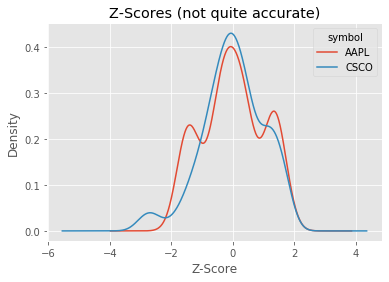

In [51]:
features.f09.unstack().plot.kde(title='Z-Scores (not quite accurate)')
plt.xlabel('Z-Score')
plt.show();

However, the above example has a subtle but important bug. It uses the mean of the whole time frame and the standard deviation of the whole time frame to calculate each datapoint. This means we are peeking ahead into the future and the feature is potentially very danger-prone (it'll work famously well in sample and fail to work out of sample...).

Fixing this is cumbersome, but necessary.

In [52]:
zscore_fun_improved = lambda x: (x - x.rolling(window=200, min_periods=20).mean())\
/ x.rolling(window=200, min_periods=20).std()
features['f10'] =prices.groupby(level='symbol').Close.apply(zscore_fun_improved)

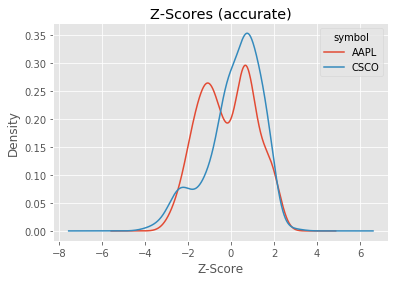

In [53]:
features.f10.unstack().plot.kde(title='Z-Scores (accurate)')
plt.xlabel('Z-Score')
plt.show();

### Percentile
Less commonly used - but equally useful - is the percentile transformation. Getting this done properly in pandas (with groupby and rolling) is possible but tricky. The below example returns the percentile rank (from 0.00 to 1.00) of traded volume for each value as compared to a trailing 200 day period.

Note that we need to use a lambda within a lambda to make this work properly. We're on the bleeding edge.

In [54]:
rollrank_fxn = lambda x: x.rolling(200,min_periods=20)\
.apply(lambda x: pd.Series(x).rank(pct=True)[0])
features['f11'] = prices.groupby(level='symbol').Volume.apply(rollrank_fxn)

### Ranking
Another interesting application of this same pattern is to rank each stock cross-sectionally rather than longitudinally as above. In other words, where does this stock rank within all of the stocks on that day, not for all prior days of that stock. The below example isn't very meaningful with only two stocks, but quite useful when using a realistic universe. In this example, we're also making use of an earlier feature (relative volume) to compare which symbol is most heavily traded for that stock's normal range in a given day. Also note that we need to dropna() prior to ranking because rank doesn't handle nulls very gracefully.

In [55]:
features['f12'] = features['f07'].dropna().groupby(level='Date').rank(pct=True) 

### Technical Indicators¶

Those with a taste for technical analysis may find it difficult to let go of your favored TA techniques.

While this is not my favored approach, you'll have no problem engineering features using these methods. From my cursory googling, it looked as though the open source package ta would be a good place to start.

Very new and only one contributor but it looks fairly comprehensive and well documented. If you find that it's missing your favorite indicators, consider contributing to the package. If you know of better such packages, please post in the comments below...

As an example:

In [56]:
import ta # technical analysis library: https://technical-analysis-library-in-python.readthedocs.io/en/latest/

# money flow index (14 day)
features['f13'] = ta.momentum.money_flow_index(prices.High, 
                                               prices.Low, prices.Close, \
                                               prices.Volume, n=14, fillna=False)
# mean-centered money flow index
features['f14'] = features['f13'] - features['f13']\
.rolling(200,min_periods=20).mean()

### Alternative Representations
A bit different than transforms are "representations", i.e., other ways to represent continuous values. All of the transforms above returned continuous values rather than "labels", and that's often a good place to start - especally for early prototypes.

However, you may want to represent the data in different ways, especially if using classification-based approaches or worried about the curse of dimensionality due to large numbers of features.

### Binning
We can easily convert a continous variable to discrete "bins" (like 1 to 10). This loses information, of course, but sometimes loss of information is a good thing if you are removing more noise than signal.

The below example shows volumes converted into ten equally sized buckets. In other words, we've converted a continuous variable into a discrete one.

NOTE: this example is not applied in a rolling fashion, so it **does suffer from some data peeking,** which I've described as the original sin. At the moment, I'm failing in my efforts to implement it in a rolling way. I'd be grateful for code snippets if anyone knows how to do this offhand.

In [57]:
n_bins = 10
bin_fxn = lambda y: pd.qcut(y,q=n_bins,labels = range(1,n_bins+1))
features['f15'] = prices.Volume.groupby(level='symbol').apply(bin_fxn)

### Signing
Very simply, you may wish to convert continuous variables into positive or negative (1 or -1) values, depending on input. For instance, was volume increasing or decreasing today?

In [58]:
features['f16'] = features['f05'].apply(np.sign)

### Plus-Minus
You may be interested in how many days in a row a value has increased (or decreased). Below is a simple pattern to do just that - it calculates the number of up-days minus the number of down days.

In [59]:
plus_minus_fxn = lambda x: x.rolling(20).sum()
features['f17'] = features['f16'].groupby(level='symbol').apply(plus_minus_fxn)

### One-Hot Encoding
Possibly the most common alternative representation is "one-hot encoding" where a categorical variable is represented as a binary. For instance, month_of_year would be represented as twelve different columns, each of which was either 0 or 1. January would be [1,0,0,0,...0] etc...

This is absolutely crucial in a few circumstances. The first is where there is false meaning in the "ordinality" of values. If we were looking to test the "santa claus effect" hypothesis, it wouldn't be helpful to use a month_of_year feature where January was "the least" and December was "the most".

The second is in cases where we are representing events or "states". Does the word "lawsuit" appear within the 10-Q footnotes? Is the company in the blackout period for share buybacks?

Finally, the particular machine learning algorithm (tree-based, neural networks) may find it easier to use binary representations than continuous or discrete ones.

The below example creates twelve one-hot features, one for each month, and names them automatically

In [60]:
month_of_year = prices.index.get_level_values(level='Date').month
one_hot_frame = pd.DataFrame(pd.get_dummies(month_of_year))
one_hot_frame.index = prices.index # Careful!  This is forcing index values without usual pandas alignments!

# create column names 
begin_num = int(features.columns[-1][-2:]) + 1 #first available feature
feat_names = ['f'+str(num) for num in list(range(begin_num,begin_num+12,1))]

# rename columns and merge
one_hot_frame.columns = feat_names
features = features.join(one_hot_frame)

In [61]:
features.iloc[:,-12:].tail()

f18  f19  f20  f21  f22  f23  f24  f25  f26  f27  f28  f29
Date       symbol                                                            
2016-12-28 CSCO      0    0    0    0    0    0    0    0    0    0    0    1
2016-12-29 AAPL      0    0    0    0    0    0    0    0    0    0    0    1
           CSCO      0    0    0    0    0    0    0    0    0    0    0    1
2016-12-30 AAPL      0    0    0    0    0    0    0    0    0    0    0    1
           CSCO      0    0    0    0    0    0    0    0    0    0    0    1

With raw data series month transformed into 12 individual one-hot encoding columns, we can train a model which will learn whether the fact that it's July should materially affect our predictions, based on historical patterns.

In [62]:
features.tail()

f01       f02         f03         f04       f05  \
Date       symbol                                                         
2016-12-28 CSCO   -0.009121  0.000652  -2153300.0  -1935300.0 -0.151903   
2016-12-29 AAPL    0.002405 -0.002655  -5866400.0  -9514000.0 -0.280610   
           CSCO    0.002963 -0.001644  -1026600.0  -3449300.0 -0.085392   
2016-12-30 AAPL   -0.007115 -0.000685  15546800.0  10551700.0  1.033731   
           CSCO   -0.011126  0.003283   9194400.0   5359100.0  0.836189   

                         f06       f07       f08  z01       f09  ...  f20  \
Date       symbol                                                ...        
2016-12-28 CSCO    16.345867 -0.465753 -0.000038  0.0  1.111075  ...    0   
2016-12-29 AAPL    16.755494 -0.578940  0.030955  1.0  0.405312  ...    0   
           CSCO    16.288625 -0.510494  0.001226  0.0  1.132238  ...    0   
2016-12-30 AAPL    16.801981 -0.143217  0.022000 -1.0  0.321638  ...    0   
           CSCO    16.404038 -0.099508 -0.006403  0.0  1.005259  ...    0   

                   f21  f22  f23  f24 f25  f26  f27  f28  f29  
Date       symbol                                              
2016-12-28 CSCO      0    0    0    0   0    0    0    0    1  
2016-12-29 AAPL      0    0    0    0   0    0    0    0    1  
           CSCO      0    0    0    0   0    0    0    0    1  
2016-12-30 AAPL      0    0    0    0   0    0    0    0    1  
           CSCO      0    0    0    0   0    0    0    0    1  

[5 rows x 30 columns]

### Summary

you've seen a simple code pattern for creating any number of "features" from raw input data, as well as some suggestions for useful transformations and alternative representations.

If we've done it right, this has resulted in many variations of similar features. Thus, before we start building models, we need a method of selecting only those features which provide greatest insight and robustness.

## Feature Selection
By design, many of the features you've created will be very similar to each other (aka "collinear") because you've derived them from the same underlying dataset. If we were to keep many highly collinear features in our dataset used to train models, it would likely cause the model to "learn" some very funky and dangerous patterns. I will discuss this in greater depth in a future post.

The goal of feature selection is to reduce our possible features into the best set of features to learn from data. This will lead to models which generalize better (i.e., work well on data they haven't seen). They will also be much more interpretable.

### Philosophy
In feature selection, we strive to meet two goals:

1. **Strength:** Choose the features with the strongest, most persistent relationships to the target outcome variable. The reasons for this are obvious.

2. **Orthogonality:** Minimize the amount of overlap or collinearity in your selected features. The importance of orthogonality (non-overlap) of features is much greater than you might guess.

I am biased towards making feature selection a relatively mechanical process. The "art" should mainly be encapsulated within the prior step (feature engineering) and the subsequent step (modeling).

Feature selection should, in my view, follow a heuristic and can be encoded into an algorithm if desired. For purposes of this tutorial, I'll keep things relatively manual.

### Preparing the data
I will begin by creating outcomes DataFrame 

In [177]:
start = pd.Timestamp("2015-01-01") 
end = pd.Timestamp("2019-11-11")

In [178]:
prices = get_symbols(['AAPL','CSCO','AMZN','PG','MSFT'],data_source='yahoo',\
                     begin_date=start,end_date=end)

In [179]:
prices.sort_index().tail()

High          Low         Open        Close  \
Date       symbol                                                       
2019-11-12 AAPL     262.790009   260.920013   261.549988   261.959991   
           AMZN    1786.219971  1771.910034  1774.660034  1778.000000   
           CSCO      48.740002    48.119999    48.290001    48.369999   
           MSFT     147.570007   146.059998   146.279999   147.070007   
           PG       119.599998   118.550003   119.489998   119.269997   

                       Volume    Adj Close  
Date       symbol                           
2019-11-12 AAPL    21847200.0   261.959991  
           AMZN     2037600.0  1778.000000  
           CSCO    15632900.0    48.369999  
           MSFT    18641600.0   146.571259  
           PG       4759600.0   119.269997

In [180]:
from pandas_datareader import data

In [181]:
AAPL = data.DataReader('AAPL', 'yahoo',start, end)
CSCO = data.DataReader('CSCO', 'yahoo',start, end)
AMZN = data.DataReader('AMZN', 'yahoo',start, end)
PG = data.DataReader('PG', 'yahoo',start, end)
MSFT = data.DataReader('MSFT', 'yahoo',start, end)

In [182]:
close_df = pd.concat([AAPL.Close,CSCO.Close,AMZN.Close,PG.Close,MSFT.Close], axis=1)
close_df.columns = ['AAPL','CSCO','AMZN','PG','MSFT']

In [183]:
close_df.tail()

,AAPL,CSCO,AMZN,PG,MSFT
Date,,,,,
2019-11-06,257.239990,48.270000,1795.770020,120.320000,144.059998
2019-11-07,259.429993,48.419998,1788.199951,119.620003,144.259995
2019-11-08,260.140015,48.830002,1785.880005,119.699997,145.960007
2019-11-11,262.200012,48.099998,1771.650024,119.330002,146.110001
2019-11-12,261.959991,48.369999,1778.000000,119.269997,147.070007


In [184]:
outcomes = pd.DataFrame(index=prices.index)

# next day's opening change
outcomes['close_1'] = prices.groupby(level='symbol').Close.pct_change(-1) # next day's returns
outcomes['close_5'] = prices.groupby(level='symbol').Close.pct_change(-5) # next week's returns
outcomes['close_10'] = prices.groupby(level='symbol').Close.pct_change(-10) # next two weeks' returns
outcomes['close_20'] = prices.groupby(level='symbol').Close.pct_change(-20) # next month's (approx) returns

outcomes.tail()

close_1  close_5  close_10  close_20
Date       symbol                                      
2019-11-12 AAPL        NaN      NaN       NaN       NaN
           AMZN        NaN      NaN       NaN       NaN
           CSCO        NaN      NaN       NaN       NaN
           MSFT        NaN      NaN       NaN       NaN
           PG          NaN      NaN       NaN       NaN

However, unlike the prior tutorials, we're going to engineer some features which are constructed to contain a relationship to the outcomes along with quite a bit of random noise. Clearly, this is not something we'd do in real usage but will help to demonstrate the concept more clearly.

Assume we have a target variable called outcome which can be (partially) predicted with three factors, factor_1, factor_2 and factor_3. There's also an unpredictble noise component.

We'll use numpy.random to graft dummy values mapped onto the indices of real price data.

In [185]:
num_obs = prices.Close.count()

factor_1 = pd.Series(np.random.randn(num_obs),index=prices.index)
factor_2 = pd.Series(np.random.randn(num_obs),index=prices.index)
factor_3 = pd.Series(np.random.randn(num_obs),index=prices.index)
outcome = 1.*factor_1 + 2.*factor_2 + 3.*factor_3 + 5.*np.random.randn(num_obs)
outcome.name = 'outcome'

outcome.tail()

Date        symbol
2019-11-12  AAPL     -3.087438
            AMZN      0.453435
            CSCO     -3.201676
            MSFT      0.209390
            PG       -3.050750
Name: outcome, dtype: float64

Now, we will engineer several variations on features which each contain some information about the three factors, plus a few which contain some interaction effects, and some which do not contain any useful data.

Note that we are, again, "cheating" here for illustration purposes.

In [186]:
features = pd.DataFrame(index=outcome.index)

features['f11'] = 0.2*factor_1 + 0.8*np.random.randn(num_obs)
features['f12'] = 0.4*factor_1 + 0.6*np.random.randn(num_obs)
features['f13'] = 0.6*factor_1 + 0.4*np.random.randn(num_obs)

features['f21'] = 0.2*factor_2 + 0.8*np.random.randn(num_obs)
features['f22'] = 0.4*factor_2 + 0.8*np.random.randn(num_obs)
features['f23'] = 0.6*factor_2 + 0.4*np.random.randn(num_obs)

features['f31'] = 0.2*factor_3 + 0.8*np.random.randn(num_obs)
features['f32'] = 0.4*factor_3 + 0.6*np.random.randn(num_obs)
features['f33'] = 0.6*factor_3 + 0.4*np.random.randn(num_obs)

features['f41'] = 0.2*factor_1+0.2*factor_2 + 0.6*np.random.randn(num_obs)
features['f42'] = 0.2*factor_2+0.2*factor_3 + 0.6*np.random.randn(num_obs)
features['f43'] = 0.2*factor_3+0.2*factor_1 + 0.6*np.random.randn(num_obs)

features['f51'] = np.random.randn(num_obs)
features['f52'] = np.random.randn(num_obs)
features['f53'] = np.random.randn(num_obs)

features.tail()

f11       f12       f13       f21       f22       f23  \
Date       symbol                                                               
2019-11-12 AAPL   -0.894202 -0.970382 -0.607178  0.273529 -0.086328 -0.350162   
           AMZN    0.722937 -0.187331  0.051288  1.027420  0.117232  0.503008   
           CSCO    0.137784 -0.008213 -0.273628 -0.405417 -0.090600 -0.777073   
           MSFT   -0.937148 -0.474955  0.673611 -1.659760  1.221852 -0.028921   
           PG      1.469217 -0.830958 -0.899328 -0.321473  1.024055  0.524678   

                        f31       f32       f33       f41       f42       f43  \
Date       symbol                                                               
2019-11-12 AAPL   -0.131141 -1.099360  0.223583 -0.346580 -0.675557 -1.276596   
           AMZN   -1.434451 -0.391980 -0.438076  0.561971  0.133318  0.261292   
           CSCO   -1.460293 -0.153188 -0.518165  0.594107 -0.457174 -1.385997   
           MSFT   -0.201744 -1.530160  0.012177 -0.101409 -1.863656  0.450641   
           PG     -0.608382 -0.515795  0.153506  0.749845 -0.459072  0.425851   

                        f51       f52       f53  
Date       symbol                                
2019-11-12 AAPL    1.172744  1.823527  0.244250  
           AMZN    0.403121  0.002591 -1.124349  
           CSCO    0.065203 -0.202567  0.479464  
           MSFT    1.507666  0.538969  0.270224  
           PG      1.814512  0.077569  0.874817

Before evaluating the features for predictive strength and orthogonality, we'll do a quick data preparation stage. It is sometimes vital to "standardize" or "normalize" data so that we get fair comparisons between features of differing scale. Strictly speaking, since all of the doctored outcome and feature data is already drawn from normal distribution (using the numpy function random.rnorm()) we don't really need this step, but good practice to include.

Here, I'll use the scikit-learn StandardScaler() method and some pandas magic to transform the data.

In [187]:
%matplotlib inline
from IPython.display import display
from scipy.cluster import hierarchy
from scipy.spatial import distance
from sklearn.preprocessing import StandardScaler,Normalizer

In [188]:
#f = features.dropna() #optional - to compare apples to apples

# standardize or normalize data 
std_scaler = StandardScaler()
features_scaled = std_scaler.fit_transform(features.dropna()) 
print (features_scaled.shape)
df = pd.DataFrame(features_scaled,index=features.dropna().index)
df.columns = features.dropna().columns
df.tail()

(6125, 15)


f11       f12       f13       f21       f22       f23  \
Date       symbol                                                               
2019-11-12 AAPL   -1.095186 -1.321982 -0.832427  0.317519 -0.096125 -0.493013   
           AMZN    0.866601 -0.235734  0.076997  1.220739  0.131857  0.698105   
           CSCO    0.156738  0.012739 -0.371752 -0.495911 -0.100911 -1.089028   
           MSFT   -1.147285 -0.634726  0.936504 -1.998713  1.369006 -0.044526   
           PG      1.771930 -1.128574 -1.235922 -0.395340  1.147478  0.728359   

                        f31       f32       f33       f41       f42       f43  \
Date       symbol                                                               
2019-11-12 AAPL   -0.126878 -1.542076  0.300650 -0.518539 -1.018517 -1.869649   
           AMZN   -1.691289 -0.546669 -0.619038  0.860607  0.218935  0.402645   
           CSCO   -1.722308 -0.210646 -0.730359  0.909387 -0.684426 -2.031294   
           MSFT   -0.211624 -2.148287  0.006802 -0.146379 -2.836126  0.682416   
           PG     -0.699728 -0.720897  0.203245  1.145792 -0.687330  0.645787   

                        f51       f52       f53  
Date       symbol                                
2019-11-12 AAPL    1.141810  1.824207  0.260971  
           AMZN    0.373322  0.009274 -1.119610  
           CSCO    0.035902 -0.195208  0.498245  
           MSFT    1.476237  0.543883  0.287173  
           PG      1.782631  0.084004  0.897059

In [189]:
# standardize outcome as well 
outcome_df = outcome.to_frame()
outcome_scaled = std_scaler.fit_transform(outcome_df.dropna()) 
outcome_scaled = pd.DataFrame(outcome_scaled,index=outcome_df.dropna().index)
outcome_scaled.columns = outcome_df.columns

outcome_scaled.tail()

outcome
Date       symbol          
2019-11-12 AAPL   -0.497432
           AMZN    0.069129
           CSCO   -0.515711
           MSFT    0.030081
           PG     -0.491562

In [190]:
out_x = prices.Close
#out_x = pd.DataFrame(out_x)
out_x.head()

Date        symbol
2015-01-02  AAPL      109.330002
            AMZN      308.519989
            CSCO       27.610001
            MSFT       46.759998
            PG         90.440002
Name: Close, dtype: float64

#### AAPL	CSCO	AMZN	PG	MSFT

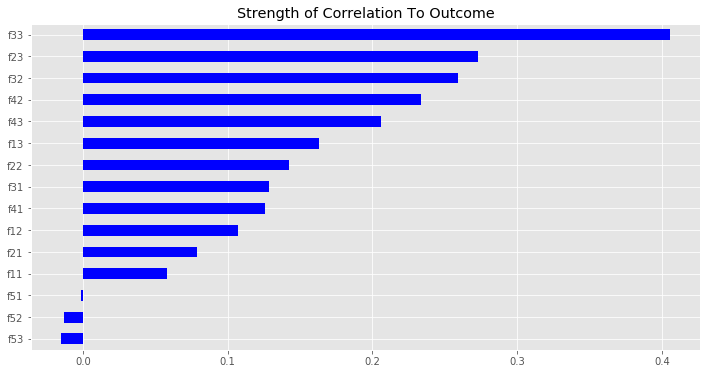

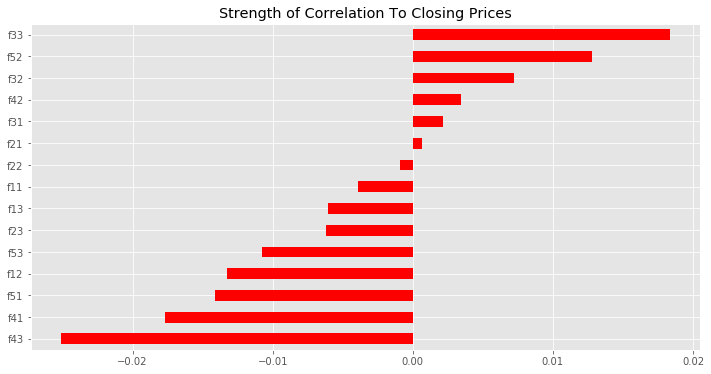

In [191]:
corr = df.corrwith(outcome)
plt.figure(figsize(12,6))
corr.sort_values().plot.barh(color = 'blue',title = 'Strength of Correlation To Outcome')
plt.show();

corr2 = df.corrwith(out_x)
plt.figure(figsize(12,6))
corr2.sort_values().plot.barh(color = 'red',title = 'Strength of Correlation To Closing Prices')
plt.show();

In [192]:
df.f33

Date        symbol
2015-01-02  AAPL     -0.654023
            AMZN     -1.307764
            CSCO     -0.345090
            MSFT      0.126231
            PG       -1.000715
                        ...   
2019-11-12  AAPL      0.300650
            AMZN     -0.619038
            CSCO     -0.730359
            MSFT      0.006802
            PG        0.203245
Name: f33, Length: 6125, dtype: float64

In [193]:
non_predictive_factor_data = alphalens.utils.get_clean_factor_and_forward_returns(df.f33, 
                                                                                  close_df, 
                                                                                  quantiles=4,
                                                                                  bins=None)

Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-3.469825,1.608445,-0.821155,0.707711,2430,40.0
2,-1.971115,1.894870,0.001778,0.541631,1215,20.0
3,-1.411804,2.835023,0.483272,0.570494,1215,20.0
4,-0.730109,4.531785,1.162255,0.662179,1215,20.0


Returns Analysis


,1D,5D,10D
Ann. alpha,-0.010,0.021,0.018
beta,-0.015,0.040,0.025
Mean Period Wise Return Top Quantile (bps),-1.047,1.110,0.850
Mean Period Wise Return Bottom Quantile (bps),0.446,-1.184,-1.147
Mean Period Wise Spread (bps),-1.494,2.052,1.720


Information Analysis


,1D,5D,10D
IC Mean,-0.007,0.027,0.032
IC Std.,0.502,0.498,0.496
Risk-Adjusted IC,-0.014,0.054,0.064
t-stat(IC),-0.497,1.896,2.214
p-value(IC),0.619,0.058,0.027
IC Skew,-0.039,-0.004,-0.026
IC Kurtosis,-0.834,-0.897,-0.867


Turnover Analysis


,10D,1D,5D
Quantile 1 Mean Turnover,0.600,0.582,0.600
Quantile 2 Mean Turnover,0.786,0.801,0.809
Quantile 3 Mean Turnover,0.795,0.792,0.813
Quantile 4 Mean Turnover,0.797,0.801,0.810


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.022,-0.003,-0.01


<Figure size 864x432 with 0 Axes>

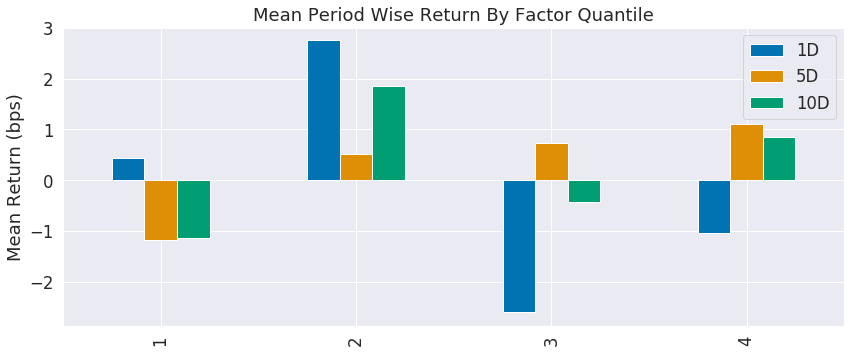

In [194]:
alphalens.tears.create_summary_tear_sheet(non_predictive_factor_data)

In [195]:
df.f12

date        asset
2015-01-02  AAPL     1.167614
            AMZN     0.568624
            CSCO    -0.726912
            MSFT     0.912104
            PG      -0.425334
                       ...   
2019-11-12  AAPL    -1.321982
            AMZN    -0.235734
            CSCO     0.012739
            MSFT    -0.634726
            PG      -1.128574
Name: f12, Length: 6125, dtype: float64

In [246]:
non_predictive_factor_data = alphalens.utils.get_clean_factor_and_forward_returns(df.f12, 
                                                                                  close_df, 
                                                                                  quantiles=4,
                                                                                  bins=None)

Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-3.788682,1.621699,-0.825889,0.714155,2430,40.0
2,-1.633479,1.731272,0.018877,0.544227,1215,20.0
3,-1.182476,2.297890,0.483884,0.553649,1215,20.0
4,-0.773692,3.481490,1.149873,0.675431,1215,20.0


Returns Analysis


,1D,5D,10D
Ann. alpha,0.006,0.031,0.015
beta,0.045,-0.013,0.005
Mean Period Wise Return Top Quantile (bps),-1.498,1.907,1.516
Mean Period Wise Return Bottom Quantile (bps),0.630,-0.741,-0.107
Mean Period Wise Spread (bps),-2.128,2.377,1.310


<Figure size 864x432 with 0 Axes>

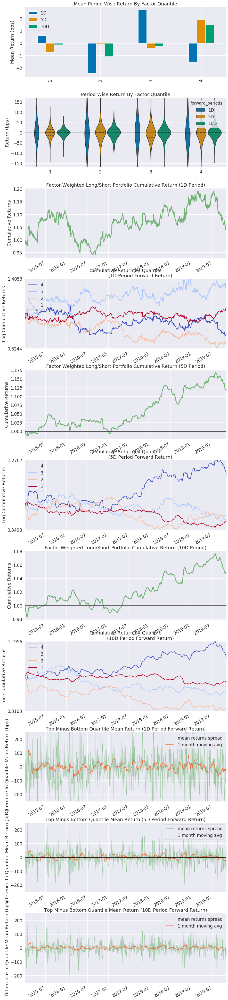

Information Analysis


,1D,5D,10D
IC Mean,-0.013,-0.001,0.001
IC Std.,0.498,0.511,0.486
Risk-Adjusted IC,-0.026,-0.002,0.002
t-stat(IC),-0.905,-0.067,0.077
p-value(IC),0.366,0.946,0.939
IC Skew,-0.008,0.059,-0.019
IC Kurtosis,-0.915,-0.895,-0.905


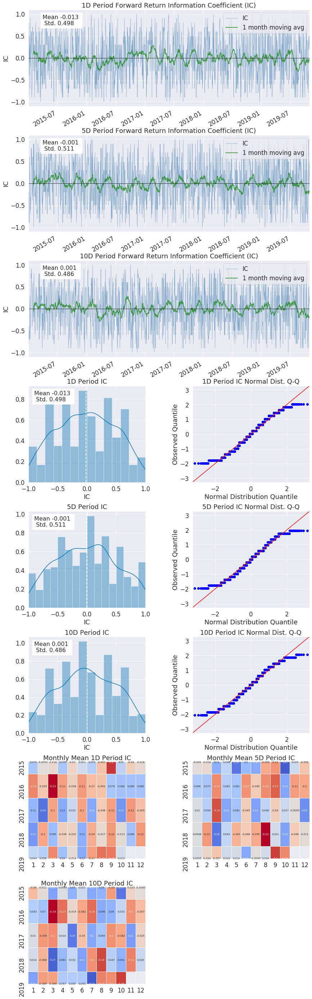

Turnover Analysis


,10D,1D,5D
Quantile 1 Mean Turnover,0.596,0.600,0.596
Quantile 2 Mean Turnover,0.795,0.787,0.804
Quantile 3 Mean Turnover,0.786,0.789,0.803
Quantile 4 Mean Turnover,0.802,0.789,0.779


,1D,5D,10D
Mean Factor Rank Autocorrelation,-0.024,0.018,0.014


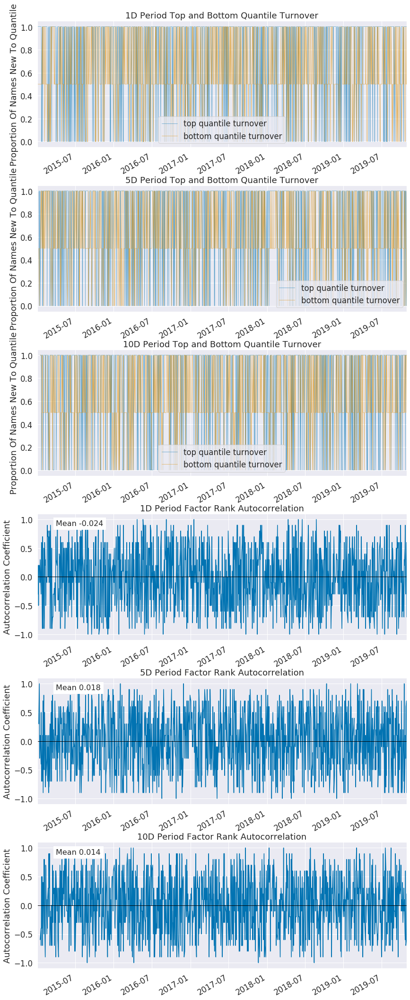

In [247]:
alphalens.tears.create_full_tear_sheet(non_predictive_factor_data)

Pretend for a minute that we don't know which features are going to be stronger and weaker, and which are going to tend to cluster together. We've got an idea that there are some quite strong features, some weaker, and some useless.

While correlation is not the perfect metric, it gives us a reasonable sense of strength of each feature's historical relationship to the outcome variable.

However, it says nothing about orthogonality. To get an idea about this, we'll take advantage of the very handy seaborn clustermap chart type which plots a heatmap representation of a covariance matrix and runs a hierarchical clustering algorithm to group together the most closely related features.

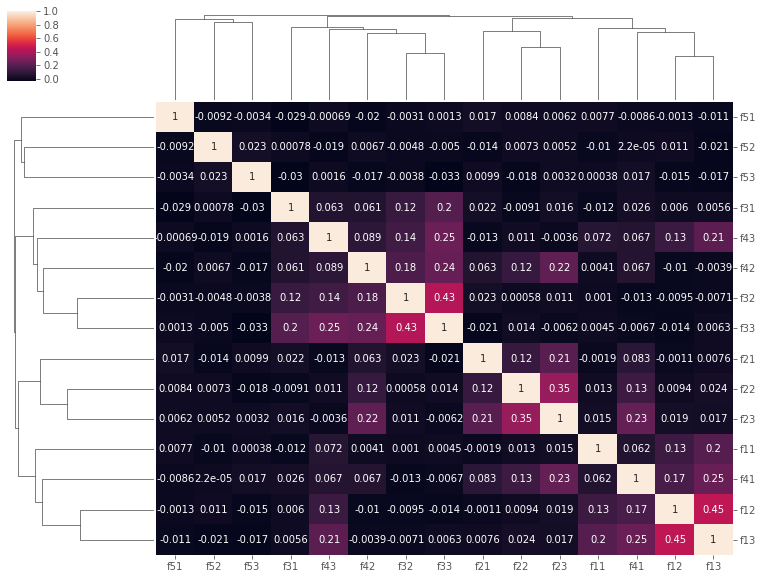

In [198]:
corr_matrix = df.corr(method='spearman')
correlations_array = np.asarray(corr_matrix)

linkage = hierarchy.linkage(distance.pdist(correlations_array), \
                            method='average')

g = sns.clustermap(corr_matrix,row_linkage=linkage,col_linkage=linkage,\
                   row_cluster=True,col_cluster=True,figsize=(13,10), annot=True, fmt='.2g')
ax = g.ax_heatmap
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)

plt.tight_layout()
plt.show();

label_order = corr_matrix.iloc[:,g.dendrogram_row.reordered_ind].columns

The algorithm has done a good job of finding the groupings of features. Of course, the diagonal of dark green represents each feature being perfectly correlated with itself, but we also see certain clusters of features which are similar to one another.

The cluster in the upper left captures factor_1 (including some of the interaction effects). factor_3 is fairly well isolated in the lower right corner, and in the middle we can see factor_2 as well as some of the noise features.

Let's next focus in only on those features with correlations of greater than 0.1 to exclude the noise and weak features.

In [199]:
corrx = corr.sort_values(ascending=False)
corrx

f33    0.405434
f23    0.272946
f32    0.258810
f42    0.233215
f43    0.206172
f13    0.163167
f22    0.142447
f31    0.128602
f41    0.125709
f12    0.106887
f21    0.078910
f11    0.057871
f51   -0.001155
f52   -0.013420
f53   -0.015277
dtype: float64

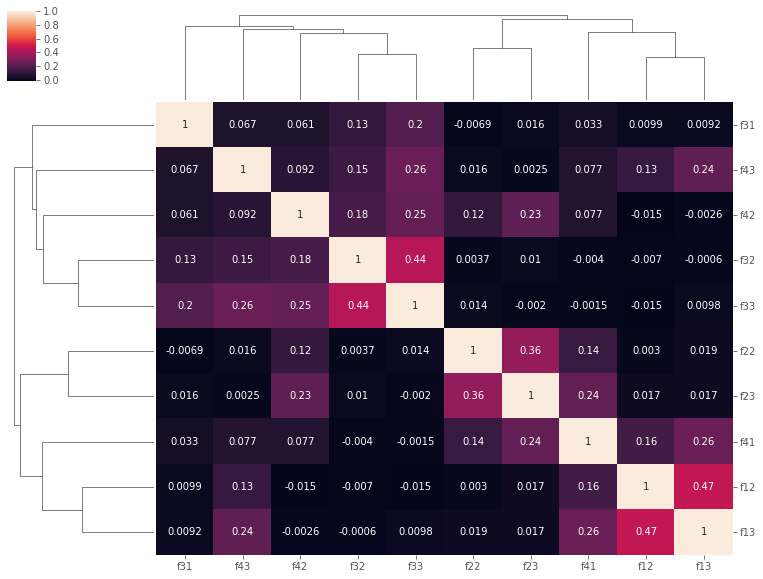

Correlation Strength:

f33    0.405434
f23    0.272946
f32    0.258810
f42    0.233215
f43    0.206172
f13    0.163167
f22    0.142447
f31    0.128602
f41    0.125709
f12    0.106887
dtype: float64


In [200]:
correlated_features = corr[corr>0.1].index.tolist()
corr_matrix = df[correlated_features].corr()
correlations_array = np.asarray(corr_matrix)

linkage = hierarchy.linkage(distance.pdist(correlations_array), \
                            method='average')

g = sns.clustermap(corr_matrix,row_linkage=linkage,col_linkage=linkage,\
                   row_cluster=True,col_cluster=True,figsize=(13,10), annot=True, fmt='.2g')
ax = g.ax_heatmap
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show();

label_order = corr_matrix.iloc[:,g.dendrogram_row.reordered_ind].columns

print("Correlation Strength:")
print('')
print(corr[corr>0.1].sort_values(ascending=False))

Ah, now the clusters look a bit sharper. We'll follow a simple heuristic to manually select the features.

**Step 1:** Take the most strongly correlated feature (f33) and add it to our list of selected features. **Step 2:** Take the second correlated feature (f23) and check to see if it's closely correlated (neighboring in the clustermap) to any features already chosen. If no, add to the list. If yes, discard. **Step 3:** Repeat this process until either (1) we've reached the target feature count, or (2) we've run out strongly correlated features.

Those interested could encode this heuristic into an algorithm without too much difficulty.

Following this heuristic, I get the below features:

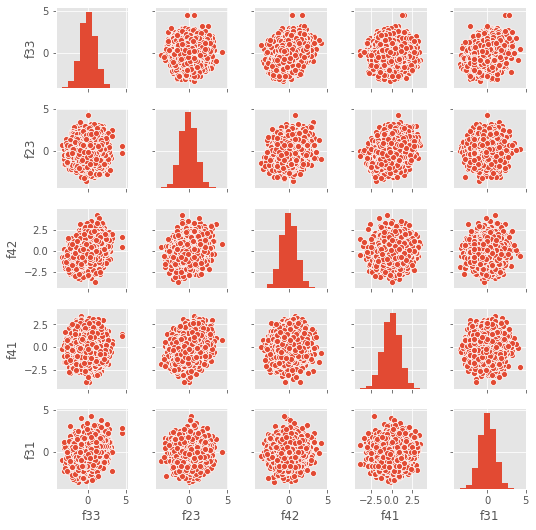

In [201]:
selected_features = ['f33','f23','f42','f41','f31']

sns.pairplot(df[selected_features],size=1.5)
plt.show()

Note that this list of features is not simply the highest correlated features. Let's run the clustermap one more time to see if we've missed any major clusters.

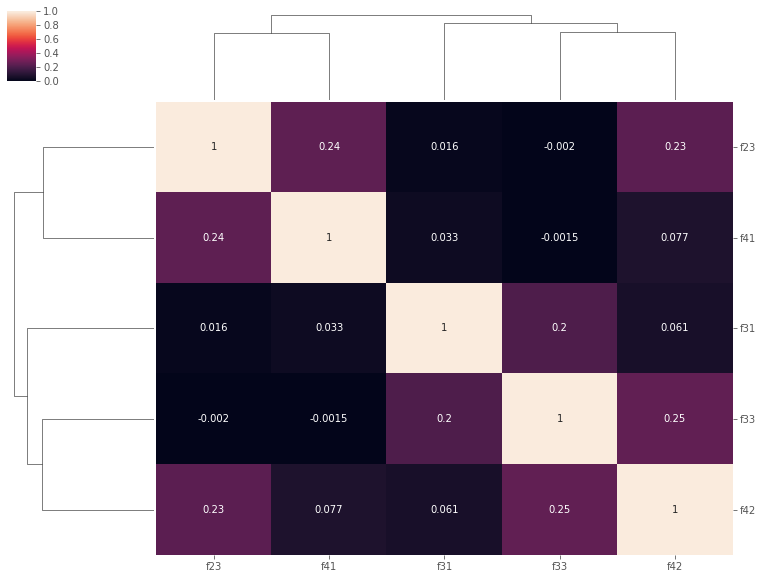

In [202]:
corr_matrix = df[selected_features].corr()
correlations_array = np.asarray(corr_matrix)

linkage = hierarchy.linkage(distance.pdist(correlations_array), method='average')

g = sns.clustermap(corr_matrix,row_linkage=linkage,col_linkage=linkage,\
                   row_cluster=True,col_cluster=True,figsize=(13,10), annot=True, fmt='.2g')
ax = g.ax_heatmap
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()

label_order = corr_matrix.iloc[:,g.dendrogram_row.reordered_ind].columns

Looks generally pretty good. There is some residual covariance between features, so we haven't achieved orthogonal nirvana, but we're pretty close.

Thus far, we've only used a simple correlation statistic across the full time period. This is a good place to start but, in my opinion, is a dangerous place to stop. Financial time series data suffers from non-stationarity and regime change, so a relationship which on average has existed may have been wildly unstable over time.

To check, we'll plot the rolling correlation of these selected features.

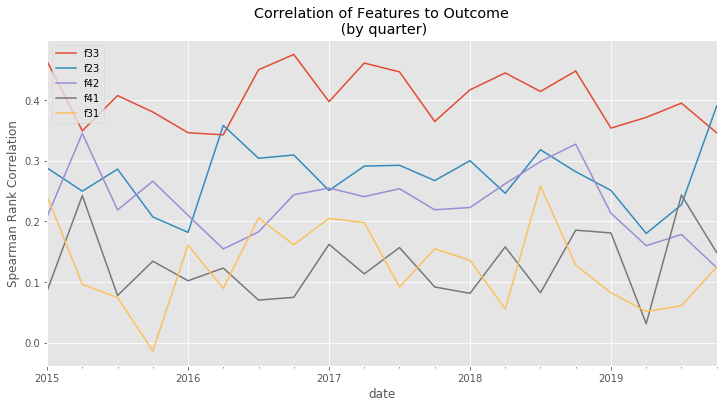

In [205]:
tmp_outcome = outcome_scaled.copy()
tmp_outcome.index.levels[0].name = 'date'
tmp_outcome.index.levels[1].name = 'asset'

tmp = df[selected_features].join(tmp_outcome).reset_index().set_index('date')
tmp.dropna().resample('Q').apply(lambda x: x.corr()).iloc[:,-1].unstack()\
.iloc[:,:-1].plot(title='Correlation of Features to Outcome\n (by quarter)',figsize=(12,6))

# shows time stability
plt.ylabel('Spearman Rank Correlation')
plt.show()

As expected, since the data wasn't modeled with any non-stationarity, our features all appear to be robust over time. This gives increased confidence that the relationship we've found is likely to persist.

### Summary

This installment of the tutorial series has walked through a systematic approach for selecting a subset of features from a universe of many overlapping (collinear) features. At this point, we're ready to model!

In the next post, I'll walk through an approach for training models in a "walk forward" basis - highly useful when working with ordered (e.g., time series) datasets.

## Walk-forward Modeling

#### Key Takeaways:

 - Traditional methods of validation and cross-validation are problematic for time series prediction problems
 
 - The solution is to use a "walk-forward" approach which incorporates new information as it becomes available.
 
 - This approach gives us a more realistic view of how effective our model would truly have been in the past, and    helps to avoid the overfitting trap.

 - It's often important to exclude data which is too far in the past using a rolling window.

The domain of market prediction presents several unique challenges for machine learning practitioners which do not exist in spam detection, natural language processing, image recognition, or other common areas of machine learning success, including:

 - Low signal-to-noise ratio
 - Non-stationarity (aka regime switching)
 - Market adaptation (aka reflexivity)

The combination of these challenges make it difficult to train and tune models which _generalize_ to the future, where it really matters. This, in my view, has led many to conclude that markets cannot be predicted with machine learning techniques.

This is a flawed conclusion. Instead, we should conclude that it's imperative to follow a modeling process which (1) avoids the trap of overfitting models to noise, (2) takes into account the sequential dimension of time series data, and (3) allows us to get an accurate view about how various models would have performed in the past _given the information we would have had at that time._

"But wait!" I hear you saying, "Overfitting is not unique to market prediction!". True, but the commonly used techniques of train-test split and cross-validation each have major flaws when applied to an inherently sequential set of financial time series data.

The overriding objective of the methods described here is to __overcome the issues inherent in traditional cross validation approachs.__

### Issues with typical approaches

__Train-Test Split:__ One frequently recommended approach in finance ML tutorials is to split the data (commonly, by time) and to train on the first chunk of data and test out-of-sample on the second. This is not wrong per se, but creates two problems:

__1.__ Only a fraction of data can be used to generate out-of-sample performance of the model. If you split 80/20, then you only get results for 2 of every 10 years of data. Yuck.

__2.__ You're implicitly biased towards the most recent period. Since we're likely going to use the older data to train and newer data to test (for good reason...) you are implicitly searching for a model which was in favor during the most recent couple of years. Maybe last year is a good approximation for next year, but maybe it's not. Maybe 2008 would hold some important lessons for us to evaluate, but these would be lost to us.

You might consider train/test split with random (or non-random) sampling but this creates other fairly obvious issues with peeking into the future.

**Cross Validation:** In normal ML usage, cross-validation methods, such as the K-fold cross validation, provide an elegant way to have our digital cake and eat it too. However, with inherently sequential datasets, it's really not kosher to train a model on 2016 and 2018 to predict 2017.

Another common method, leave one out cross-validation, creates even more extreme peeking into the future. These issues are especially intolerable if your model predicts values multiple bars in the future, which results in your models being trained on data which significantly overlaps with your test data - a subtle but deadly form of data spillover.

### The Solution: Walk-forward Train/Test
But we are not stuck with either of these problematic approaches. The better - and I think much more intuitive - approach is to simulate models in a "walk-forward" sequence, periodically re-training the model to incorporate all data available at that point in time.

The below picture is worth at least 1000 words. Say we have six years of data to train + test. At the end of the first year (T=1) we could have built model M1, which was trained on the first year's data (the grey bar). After the 5th year, we could use up to five years of data to train model M5.

 <img src="https://alphascientist.com/images/walkforward.png" alt="Alt text that describes the graphic" title="Title text" />

we'll begin by fetching some real stock price data and then generating from it a synthetic dataset which will make it easier to follow the principles of this tutorial.

In [115]:
prices.head()

High         Low        Open       Close      Volume  \
Date       symbol                                                               
2015-01-02 AAPL    111.440002  107.349998  111.389999  109.330002  53204600.0   
           AMZN    314.750000  306.959991  312.579987  308.519989   2783200.0   
           CSCO     28.120001   27.379999   27.860001   27.610001  22926500.0   
           MSFT     47.419998   46.540001   46.660000   46.759998  27913900.0   
           PG       91.000000   89.919998   90.839996   90.440002   7251400.0   

                    Adj Close  
Date       symbol              
2015-01-02 AAPL    100.454300  
           AMZN    308.519989  
           CSCO     23.754028  
           MSFT     41.979183  
           PG       77.247879

###  Walk-Forward Feature Selection

we will generate some random data to serve as features and then derive an outcome (response) variable from the features _(to ensure that our made-up features will have ability to partially predict the target variable)._

However, this go around we'll add two non-random patterns to the data. First, we will add some amount of "memory" (autoregression) to the white noise with a short function called add_memory(). This will make the data somewhat less random and more similar to actual markets - which I think we can all agree is not a purely gaussian random walk...

Second, we'll add trend to the importance of each feature to the target variable to simulate the reality that various features - and the market factors they represent - move in and out of favor over time (aka "regime shift").

 - Feature __f01__ is becoming more important
 - Feature __f02__ is becoming less important
 - Feature __f03__ is oscillating between very important and unimportant (using a sine wave pattern)
 - Feature __f04__ is not changing

In [116]:
num_obs = prices.Close.count()

def add_memory(s,n_days=50,memory_strength=0.1):
    ''' adds autoregressive behavior to series of data'''
    add_ewm = lambda x: (1-memory_strength)*x + memory_strength*x.ewm(n_days).mean()
    out = s.groupby(level='symbol').apply(add_ewm)
    return out

# generate feature data
f01 = pd.Series(np.random.randn(num_obs),index=prices.index)
f01 = add_memory(f01,10,0.1)
f02 = pd.Series(np.random.randn(num_obs),index=prices.index)
f02 = add_memory(f02,10,0.1)
f03 = pd.Series(np.random.randn(num_obs),index=prices.index)
f03 = add_memory(f03,10,0.1)
f04 = pd.Series(np.random.randn(num_obs),index=prices.index)
f04 = f04 # no memory

## now, create response variable such that it is related to features
# f01 becomes increasingly important, f02 becomes decreasingly important,
# f03 oscillates in importance, f04 is stationary, finally a noise component is added

outcome =   f01 * np.linspace(0.5,1.5,num_obs) + \
            f02 * np.linspace(1.5,0.5,num_obs) + \
            f03 * pd.Series(np.sin(2*np.pi*np.linspace(0,1,num_obs)*2)+1,index=f03.index) + \
            f04 + \
            np.random.randn(num_obs) * 3 
outcome.name = 'outcome'

In [117]:
outcome.head()

Date        symbol
2015-01-02  AAPL      4.667672
            AMZN     -0.181691
            CSCO     -4.191774
            MSFT      1.770163
            PG       -5.137484
Name: outcome, dtype: float64

So, we've now got four features which contain random and non-random elements, and we have an outcome target variable which can be partially explained by these features.

Let's run a quick linear model to verify that this worked as expected:

In [118]:
model = LinearRegression()
features = pd.concat([f01,f02,f03,f04],axis=1)
features.columns = ['f01','f02','f03','f04']
model.fit(X=features,y=outcome)
print('RSQ: '+str(model.score(X=features,y=outcome)))
print('Regression Coefficients: '+str(model.coef_))

RSQ: 0.27224466858770235
Regression Coefficients: [0.9589984  0.99914027 1.01928011 1.02381108]


In [119]:
features.head()

f01       f02       f03       f04
Date       symbol                                        
2015-01-02 AAPL    0.730499 -1.291721 -0.130872  1.675802
           AMZN   -1.591777  0.492180 -0.677773  1.121153
           CSCO    0.643365  0.063899 -1.361718  1.307418
           MSFT   -0.071397  1.509857 -0.790628  0.390496
           PG     -0.692381 -1.539914 -0.532655 -1.853341

Indeed. A simple, linear model run on the entire dataset shows a remarkable (for this domain) RSQ of >0.26 and approximately equal coefficients for each of the features, suggesting that they're all contributing strongly to the model.

However, this overlooks the very important reality that our data is non-stationary and what matters is how the model will generalize to future, unseen data.

To illustrate, I'll re-run the same model after splitting the data into train/test sets, with the first 80% used to train and the last 20% used to test.

In [120]:
split_point = int(0.80*len(outcome))

X_train = features.iloc[:split_point,:] 
y_train = outcome.iloc[:split_point] 
X_test = features.iloc[split_point:,:] 
y_test = outcome.iloc[split_point:] 

model = LinearRegression()
model.fit(X=X_train,y=y_train)

print('RSQ in sample: '+str(model.score(X=X_train,y=y_train)))
print('RSQ out of sample: '+str(model.score(X=X_test,y=y_test)))
print('Regression Coefficients: '+str(model.coef_))

RSQ in sample: 0.2922885857368872
RSQ out of sample: 0.1642454001903597
Regression Coefficients: [0.85170404 1.09107272 1.21167633 1.01891942]


Here, the results tell a different story. We see that the model's RSQ on the unseen test data degraded to only about half of the value on the training data. Even if we were still satisfied with the degraded RSQ value, we would carry concern that perhaps the next period of time the models would degrade even further.

This is where our walk-forward process comes in.

**A better approach...**

Here, I'll outline the basic design pattern for a robust approach to walk-forward modeling. This is simplified. In real-world usage, we'd likely add many enhancements but this will illustrate the concept.

### Training models
The first step of the walk-forward approach is to train our model _using only the data available at any given point in time._ Theoretically, we have new data every bar so could we could retrain the model daily if we wished. However, for simplicity we'll retrain much less frequently - at the end of each calendar year.

We'll first create a list of timestamps for all end-of-year dates in our dataset. These will become our days on which to retrain models. Then, on each of the recalculation dates, we'll follow a simple procedure:

__1.__ slice out only the data which has happened up until that point

__2.__ train a model with that data

__3.__ save a copy of that fitted model object in a pandas Series called models which is indexed by the recalculation date.

We could just as easily have used a dict or other data structure, but I find that pandas Series works well for this purpose. Pandas is not just for numbers, after all...

In [121]:
recalc_dates = features.resample('Q',level='Date').mean().index.values[:-1]

models = pd.Series(index=recalc_dates)
for date in recalc_dates:
    X_train = features.xs(slice(None,date),level='Date',drop_level=False)
    y_train = outcome.xs(slice(None,date),level='Date',drop_level=False)
    model = LinearRegression()
    model.fit(X_train,y_train)
    models.loc[date] = model
    
    print("Training on the first {} records, through {}"\
          .format(len(y_train),y_train.index.get_level_values('Date').max()))

Training on the first 305 records, through 2015-03-31 00:00:00
Training on the first 620 records, through 2015-06-30 00:00:00
Training on the first 940 records, through 2015-09-30 00:00:00
Training on the first 1260 records, through 2015-12-31 00:00:00
Training on the first 1565 records, through 2016-03-31 00:00:00
Training on the first 1885 records, through 2016-06-30 00:00:00
Training on the first 2205 records, through 2016-09-30 00:00:00
Training on the first 2520 records, through 2016-12-30 00:00:00
Training on the first 2830 records, through 2017-03-31 00:00:00
Training on the first 3145 records, through 2017-06-30 00:00:00
Training on the first 3460 records, through 2017-09-29 00:00:00
Training on the first 3775 records, through 2017-12-29 00:00:00
Training on the first 4080 records, through 2018-03-29 00:00:00
Training on the first 4400 records, through 2018-06-29 00:00:00
Training on the first 4715 records, through 2018-09-28 00:00:00
Training on the first 5030 records, through

To visualize how the model is changing over time, I'll create a simple plotting function of coefficients:

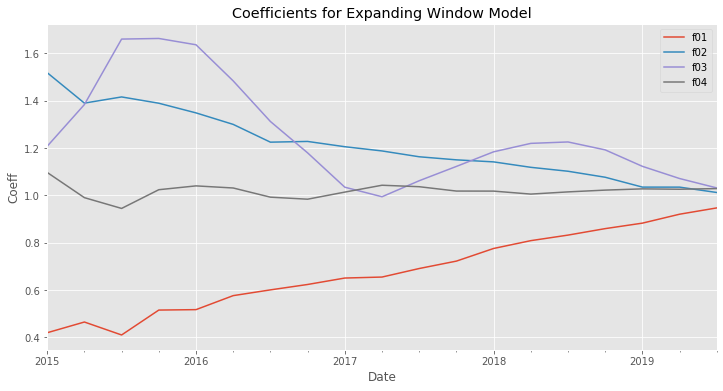

In [122]:
def extract_coefs(models):
    coefs = pd.DataFrame()
    for i,model in enumerate(models):
        model_coefs = pd.Series(model.coef_,index=['f01','f02','f03','f04']) #extract coefficients for model
        model_coefs.name = models.index[i] # name it with the recalc date
        coefs = pd.concat([coefs,model_coefs],axis=1)
    return coefs.T

extract_coefs(models).plot(title='Coefficients for Expanding Window Model',figsize=(12,6))
plt.xlabel('Date')
plt.ylabel('Coeff')
plt.show();

Notice a few things about how the model's coefficients change over time:

 - The first feature gets increasing weight as it becomes a more important explanatory factor in the target variable,
 - the second feature does just the opposite, as it should,
 - the third feature oscillates before converging on a relatively lower endpoint, and
 - the fourth feature is mostly unchanged
 
But, in a world of constantly shifting regimes, we can do better.

We know that, by the end of the dataset, __f01__ is actually much superior to __f02__ however they end at about equal weights. This is because in our final model building instance, we are using all of our data to train, and this entire set of data correctly shows that on average __f02__ is as useful as __f01__, ignoring that __f02's__ best days are long past.

### 90D Rolling Window Model

In [123]:
recalc_dates = features.resample('Q',level='Date').mean().index.values[:-1]

models = pd.Series(index=recalc_dates)
for date in recalc_dates:
    X_train = features.xs(slice(date-pd.Timedelta('90 days'),date),level='Date',drop_level=False)
    y_train = outcome.xs(slice(date-pd.Timedelta('90 days'),date),level='Date',drop_level=False)
    model = LinearRegression()
    model.fit(X_train,y_train)
    models.loc[date] = model
    
    print("Training on the most recent {} records".format(len(y_train)))

Training on the most recent 305 records
Training on the most recent 315 records
Training on the most recent 315 records
Training on the most recent 315 records
Training on the most recent 305 records
Training on the most recent 320 records
Training on the most recent 315 records
Training on the most recent 315 records
Training on the most recent 310 records
Training on the most recent 315 records
Training on the most recent 315 records
Training on the most recent 315 records
Training on the most recent 305 records
Training on the most recent 320 records
Training on the most recent 315 records
Training on the most recent 310 records
Training on the most recent 310 records
Training on the most recent 315 records
Training on the most recent 315 records


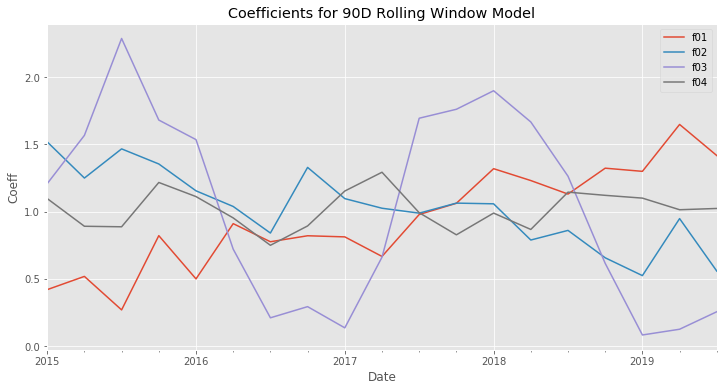

In [124]:
extract_coefs(models).plot(title='Coefficients for 90D Rolling Window Model',figsize=(12,6))
plt.xlabel('Date')
plt.ylabel('Coeff')
plt.show();

This approach of only considering the 90 days' data prior to each model re-training has had a big impact. We now see that __f01__ has overtaken __f02__ in significance by the end of the time period, as we'd hope. The on-again, off-again feature __f03__ has risen and fallen in prominence over time, again just as we'd hope.

### Using models
The second stage of the process is using these walk-forward models. The process is similar and equally simple.

First, we create two arrays, __begin_dates__ and __end_dates__, which contain the dates on which each model is used. For instance, for the first model (i=0), we will apply this model to features beginning on the date we trained the model __(recalc_date)__ until the day the next model is trained. The __end_dates__ array therefore drops the 0th element and appends to the end a far-off date (in the year 2099).

We can easily use this pattern to apply the models to true out of sample features. As long as it's not later than the year 2099, we'll simply apply the latest model we have.

In [125]:
begin_dates = models.index
end_dates = models.index[1:].append(pd.to_datetime(['2099-12-31']))

predictions = pd.Series(index=features.index)

for i,model in enumerate(models): #loop thru each models object in collection
    X = features.xs(slice(begin_dates[i],end_dates[i]),level='Date',drop_level=False)
    p = pd.Series(model.predict(X),index=X.index)
    predictions.loc[X.index] = p

predictions.shape

(6125,)

So, this looped through each of the models we had trained at various points in time and, for each, used that model to predict the period of time until the next model became available. It runs!

Now we can confirm that the rolling model is, in fact, better than the "expanding" model by making predictions with each and comparing to truth.

In [126]:
models_expanding_window = pd.Series(index=recalc_dates)
for date in recalc_dates:
    X_train = features.xs(slice(None,date),level='Date',drop_level=False)
    y_train = outcome.xs(slice(None,date),level='Date',drop_level=False)
    model = LinearRegression()
    model.fit(X_train,y_train)
    models_expanding_window.loc[date] = model
    
models_rolling_window = pd.Series(index=recalc_dates)
for date in recalc_dates:
    X_train = features.xs(slice(date-pd.Timedelta('90 days'),date),level='Date',drop_level=False)
    y_train = outcome.xs(slice(date-pd.Timedelta('90 days'),date),level='Date',drop_level=False)
    model = LinearRegression()
    model.fit(X_train,y_train)
    models_rolling_window.loc[date] = model
    
begin_dates = models.index
end_dates = models.index[1:].append(pd.to_datetime(['2099-12-31']))

predictions_expanding_window = pd.Series(index=features.index)
for i,model in enumerate(models_expanding_window): #loop thru each models object in collection
    X = features.xs(slice(begin_dates[i],end_dates[i]),level='Date',drop_level=False)
    p = pd.Series(model.predict(X),index=X.index)
    predictions_expanding_window.loc[X.index] = p
    
predictions_rolling_window = pd.Series(index=features.index)
for i,model in enumerate(models_rolling_window): #loop thru each models object in collection
    X = features.xs(slice(begin_dates[i],end_dates[i]),level='Date',drop_level=False)
    p = pd.Series(model.predict(X),index=X.index)
    predictions_rolling_window.loc[X.index] = p

In [127]:
from sklearn.metrics import r2_score

common_idx = outcome.dropna().index.intersection(predictions_expanding_window.dropna().index)
rsq_expanding = r2_score(y_true = outcome[common_idx],y_pred=predictions_expanding_window[common_idx])
rsq_rolling = r2_score(y_true = outcome[common_idx],y_pred=predictions_rolling_window[common_idx])

Expanding Window RSQ: 0.263
Rolling 90D Window RSQ: 0.293


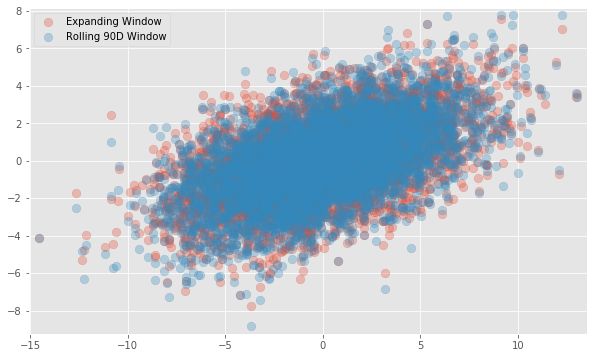


                     Expanding Window


<Figure size 720x432 with 0 Axes>

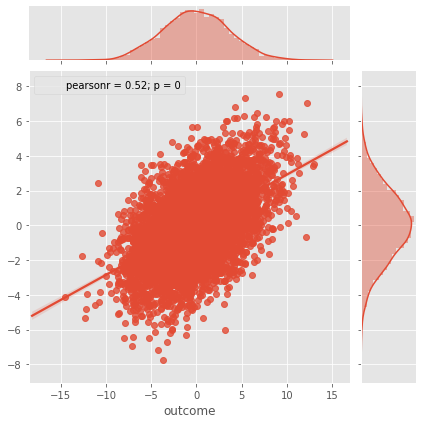


                     Rolling 90D Window


<Figure size 720x432 with 0 Axes>

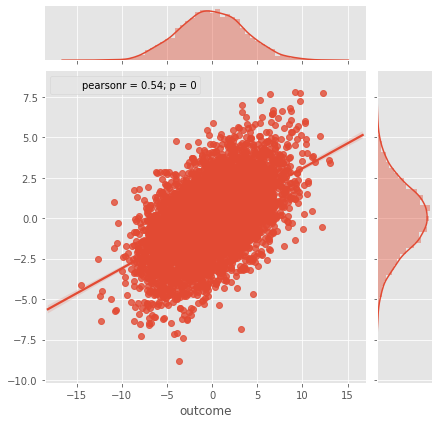

In [128]:
from scipy.stats import pearsonr

print("Expanding Window RSQ: {}".format(round(rsq_expanding,3)))
print("Rolling 90D Window RSQ: {}".format(round(rsq_rolling,3)))

# Create a scatter plot with train and test actual vs predictions
plt.figure(figsize=(10, 6))
plt.scatter(outcome[common_idx], predictions_expanding_window[common_idx], label='Expanding Window', alpha=0.3, s=75)
plt.scatter(outcome[common_idx], predictions_rolling_window[common_idx], label='Rolling 90D Window', alpha=0.3, s=75)
plt.margins(0.01)
plt.legend()
plt.show();
print('')
print('                     Expanding Window')
plt.figure(figsize=(10, 6))
sns.jointplot(outcome[common_idx], predictions_expanding_window[common_idx], kind='reg', size=6).annotate(pearsonr)
plt.margins(0.01)
plt.show();
print('')
print('                     Rolling 90D Window')
plt.figure(figsize=(10, 6))
sns.jointplot(outcome[common_idx], predictions_rolling_window[common_idx], kind='reg', size=6).annotate(pearsonr)
plt.margins(0.01)
plt.show();

Great! All of that work added about 3 points to the RSQ, which is certainly worth the effort.

### Avoiding complexity
The value of this walk-forward methodology is greatest when it helps you to avoid the scourge of overfitting. The linear regression model used up to this point is relatively resistant to overfit, since it has few parameters.

Let's say that, instead of a simple linear regression, we used the much more overfit-prone DecisionTree, which has tendency to "memorize the past" rather than to recognize patterns in it.

In [129]:
from sklearn.tree import DecisionTreeRegressor

split_point = int(0.80*len(outcome))

X_train = features.iloc[:split_point,:] 
y_train = outcome.iloc[:split_point] 
X_test = features.iloc[split_point:,:] 
y_test = outcome.iloc[split_point:] 

model = DecisionTreeRegressor(max_depth=3)
model.fit(X=X_train,y=y_train)

print('RSQ in sample: '+str(round(model.score(X=X_train,y=y_train),3)))
print('RSQ out of sample: '+str(round(model.score(X=X_test,y=y_test),3)))

RSQ in sample: 0.183
RSQ out of sample: 0.017


This leads to overfit disaster! Now, we'll do the same with our walk-forward framework:

In [130]:
recalc_dates = features.resample('Q',level='Date').mean().index.values[:-1]

models_rolling_window = pd.Series(index=recalc_dates)
for date in recalc_dates:
    X_train = features.xs(slice(date-pd.Timedelta('365 days'),date),level='Date',drop_level=False)
    y_train = outcome.xs(slice(date-pd.Timedelta('365 days'),date),level='Date',drop_level=False)
    model = DecisionTreeRegressor(max_depth=3)
    model.fit(X_train,y_train)
    models_rolling_window.loc[date] = model
    
predictions_rolling_window = pd.Series(index=features.index)
for i,model in enumerate(models_rolling_window): #loop thru each models object in collection
    X = features.xs(slice(begin_dates[i],end_dates[i]),level='Date',drop_level=False)
    p = pd.Series(model.predict(X),index=X.index)
    predictions_rolling_window.loc[X.index] = p

common_idx = y_test.dropna().index.intersection(predictions_rolling_window.dropna().index)
rsq_rolling = r2_score(y_true = y_test[common_idx],y_pred=predictions_rolling_window[common_idx])
print("RSQ out of sample (90d rolling): {}".format(round(rsq_rolling,3)))

RSQ out of sample (90d rolling): 0.108


In [131]:
for i, model in enumerate(models_rolling_window): #loop thru each models object in collection
    importances = pd.Series(model.feature_importances_)

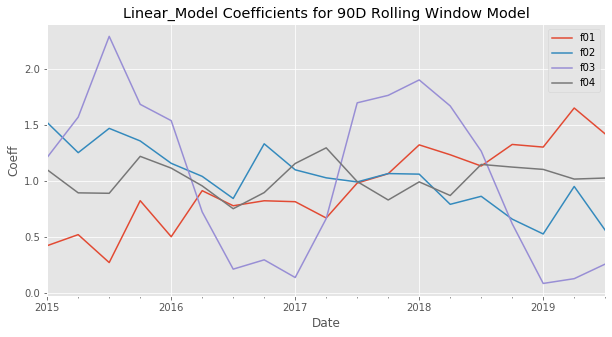

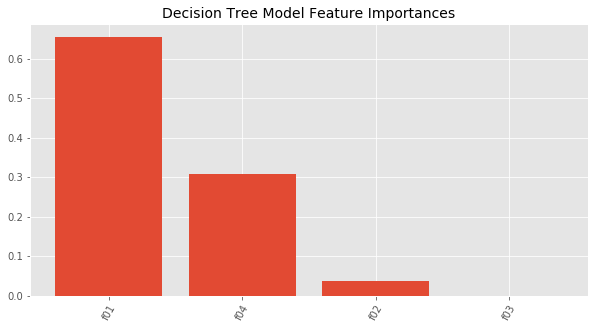

In [132]:
extract_coefs(models).plot(title='Linear_Model Coefficients for 90D Rolling Window Model',figsize=(10,5))
plt.xlabel('Date')
plt.ylabel('Coeff')
plt.show();

# Get the index of importances from greatest importance to least
sorted_index = np.argsort(importances)[::-1]
x = range(len(importances))

feature_names = features.columns

# Create tick labels 
labels = np.array(feature_names)[sorted_index]
plt.figure(figsize=(10, 5))
plt.bar(x, importances[sorted_index], tick_label=labels)

# Rotate tick labels to vertical
plt.xticks(rotation=60)
plt.title('Decision Tree Model Feature Importances', size=14)
plt.show();

Much, much better. While the RSQ result ain't great (and actually worse than the linear regression model), that's much preferred to being fooled by an extraordinarily overfitted result like above. We could have guessed that DecisionTree would be a silly model type to try in this situation but it illustrates the point.

### Summary
That, in a nutshell, is the walk-forward modeling framework. The key points to keep in mind are:

 - Traditional methods of validation and cross-validation are problematic for time series prediction problems
 - The solution is to use a "walk-forward" approach which incorporates new information as it becomes available.
 - This approach gives us a more realistic view of how effective our model would truly have been in the past, and helps to avoid the overfitting trap.
 - In addition to excluding any future data from the training process, it's often important to exclude data which is too far in the past.

## Model Evaluation

Use of machine learning in the quantitative investment field is, by all indications, skyrocketing. The proliferation of easily accessible data - both traditional and alternative - along with some very approachable frameworks for machine learning models - is encouraging many to explore the arena.

However, these financial ML explorers are learning that there are many ways in which using ML to predict financial time series differs greatly from labeling cat pictures or flagging spam. Among these differences is that traditional model performance metrics (RSQ, MSE, accuracy, F1, etc...) can be misleading and incomplete.

Over the past several years, I've developed a set of metrics which have proved useful for comparing and optimizing financial time series models. These metrics attempt to measure models' predictive power but also their trade-ability, critically important for those who actually intend to use their models in the real world.

I will present a general outline of my approach and will demonstrate a few of the most useful metrics I've added to my standard "scorecard".

In [133]:
prices.head()

High         Low        Open       Close      Volume  \
Date       symbol                                                               
2015-01-02 AAPL    111.440002  107.349998  111.389999  109.330002  53204600.0   
           AMZN    314.750000  306.959991  312.579987  308.519989   2783200.0   
           CSCO     28.120001   27.379999   27.860001   27.610001  22926500.0   
           MSFT     47.419998   46.540001   46.660000   46.759998  27913900.0   
           PG       91.000000   89.919998   90.839996   90.440002   7251400.0   

                    Adj Close  
Date       symbol              
2015-01-02 AAPL    100.454300  
           AMZN    308.519989  
           CSCO     23.754028  
           MSFT     41.979183  
           PG       77.247879

The below code generates several features then synthetically generates an outcome series from them (along with noise). This guarantees that the features will be informative, since the outcome has been constructed to ensure a relationship.

In [134]:
num_obs = prices.Close.count()

def add_memory(s,n_days=50,mem_strength=0.1):
    ''' adds autoregressive behavior to series of data'''
    add_ewm = lambda x: (1-mem_strength)*x + mem_strength*x.ewm(n_days).mean()
    out = s.groupby(level='symbol').apply(add_ewm)
    return out

# generate feature data
f01 = pd.Series(np.random.randn(num_obs),index=prices.index)
f01 = add_memory(f01,10,0.1)
f02 = pd.Series(np.random.randn(num_obs),index=prices.index)
f02 = add_memory(f02,10,0.1)
f03 = pd.Series(np.random.randn(num_obs),index=prices.index)
f03 = add_memory(f03,10,0.1)
f04 = pd.Series(np.random.randn(num_obs),index=prices.index)
f04 = f04 # no memory

features = pd.concat([f01,f02,f03,f04],axis=1)

## now, create response variable such that it is related to features
# f01 becomes increasingly important, f02 becomes decreasingly important,
# f03 oscillates in importance, f04 is stationary, 
# and finally a noise component is added

outcome =   f01 * np.linspace(0.5,1.5,num_obs) + \
            f02 * np.linspace(1.5,0.5,num_obs) + \
            f03 * pd.Series(np.sin(2*np.pi*np.linspace(0,1,num_obs)*2)+1,index=f03.index) + \
            f04 + \
            np.random.randn(num_obs) * 3 
outcome.name = 'outcome'

### Generating models and predictions
Imagine that we created a simple linear model (such as below) and wanted to measure its effectiveness at prediction.

Note: we'll follow the walk-forward modeling process. 

In [135]:
## fit models for each timestep on a walk-forward basis
recalc_dates = features.resample('Q',level='Date').mean().index.values[:-1]
models = pd.Series(index=recalc_dates)
for date in recalc_dates:
    X_train = features.xs(slice(None,date),level='Date',drop_level=False)
    y_train = outcome.xs(slice(None,date),level='Date',drop_level=False)
    model = LinearRegression()
    model.fit(X_train,y_train)
    models.loc[date] = model

## predict values walk-forward (all predictions out of sample)
begin_dates = models.index
end_dates = models.index[1:].append(pd.to_datetime(['2099-12-31']))

predictions = pd.Series(index=features.index)

for i,model in enumerate(models): #loop thru each models object in collection
    X = features.xs(slice(begin_dates[i],end_dates[i]),level='Date',drop_level=False)
    p = pd.Series(model.predict(X),index=X.index)
    predictions.loc[X.index] = p

### Traditional model evaluation
So we've got a model, we've got a sizeable set of (out of sample) predictions. Is the model any good? Should we junk it, tune it, or trade it? Since this is a regression model, I'll throw our data into scikit-learn's metrics package.

In [136]:
import sklearn.metrics as metrics

# make sure we have 1-for-1 mapping between pred and true
common_idx = outcome.dropna().index.intersection(predictions.dropna().index)
y_true = outcome[common_idx]
y_true.name = 'y_true'
y_pred = predictions[common_idx]
y_pred.name = 'y_pred'

standard_metrics = pd.Series()

standard_metrics.loc['explained variance'] = metrics.explained_variance_score(y_true, y_pred)
standard_metrics.loc['MAE'] = metrics.mean_absolute_error(y_true, y_pred)
standard_metrics.loc['MSE'] = metrics.mean_squared_error(y_true, y_pred)
standard_metrics.loc['MedAE'] = metrics.median_absolute_error(y_true, y_pred)
standard_metrics.loc['RSQ'] = metrics.r2_score(y_true, y_pred)

print(standard_metrics)

explained variance    0.256613
MAE                   2.469044
MSE                   9.624696
MedAE                 2.072262
RSQ                   0.256530
dtype: float64


These stats don't really tell us much by themselves. You may have an intuition for r-squared so that may give you a level of confidence in the models. However, even this metric has problems not to mention does not tell us much about the practicality of this signal from a trading point of view.

True, we could construct some trading rules around this series of predictions and perform a formal backtest on that. However, that is quite time consuming and introduces a number of extraneous variables into the equation.

### A better way... Creating custom metrics¶
Instead of relying on generic ML metrics, we will create several custom metrics that will hopefully give a more complete picture of strength, reliability, and practicality of these models.

I'll work through an example of creating an extensible scorecard with about a half dozen custom-defined metrics as a starting point. You can feel free to extend this into a longer scorecard which is suited to your needs and beliefs. In my own trading, I use about 25 metrics in a standard "scorecard" each time I evaluate a model. You may prefer to use more, fewer, or different metrics but the process should be applicable.

I'll focus only on regression-oriented metrics (i.e., those which use a continuous prediction rather than a binary or classification prediction). It's trivial to re-purpose the same framework to a classification-oriented environment.

### Step 1: Preprocess data primitives
Before implementing specific metrics we need to do some data pre-processing. It'll become clear why doing this first will save considerable time later when calculating aggregate metrics.

To create these intermediate values, you'll need the following inputs:

 - **y_pred:** the continuous variable prediction made by your model for each timestep, for each symbol
 - **y_true:** the continuous variable actual outcome for each timestep, for each symbol.
 - **index:** this is the unique identifier for each prediction or actual result. If working with a single instrument, then you can simply use date (or time or whatever). If you're using multiple instruments, a multi-index with (date/symbol) is necessary.
 
In other words, if your model is predicting one-day price changes, you'd want your y_pred to be the model's predictions made as of March 9th (for the coming day), indexed as 2017-03-09 and you'd want the actual future outcome which will play out in the next day also aligned to Mar 9th. This "peeking" convention is very useful for working with large sets of data across different time horizons.

The raw input data we need to provide might look something like this:

In [137]:
print(pd.concat([y_pred,y_true],axis=1).tail())

                     y_pred    y_true
Date       symbol                    
2018-01-17 CSCO    0.976903  0.401080
2018-09-28 CSCO    1.032566  3.720938
2016-11-04 CSCO   -1.247828  3.449371
2018-08-01 CSCO   -1.720922  3.570213
2016-01-21 AMZN    2.074347  0.661273


We will feed this data into a simple function which will return a dataframe with the y_pred and y_true values, along with several other useful derivative values. These derivative values include:

 - **sign_pred:** positive or negative sign of prediction
 - **sign_true:** positive or negative sign of true outcome
 - **is_correct:** 1 if sign_pred == sign_true, else 0
 - **is_incorrect:** opposite
 - **is_predicted:** 1 if the model has made a valid prediction, 0 if not. This is important if models only emit predictions when they have a certain level of confidence
 - **result:** the profit (loss) resulting from betting one unit in the direction of the sign_pred. This is the continuous variable result of following the model

In [138]:
def make_df(y_pred,y_true):
    y_pred.name = 'y_pred'
    y_true.name = 'y_true'
    
    df = pd.concat([y_pred,y_true],axis=1)

    df['sign_pred'] = df.y_pred.apply(np.sign)
    df['sign_true'] = df.y_true.apply(np.sign)
    df['is_correct'] = 0
    df.loc[df.sign_pred * df.sign_true > 0 ,'is_correct'] = 1 # only registers 1 when prediction was made AND it was correct
    df['is_incorrect'] = 0
    df.loc[df.sign_pred * df.sign_true < 0,'is_incorrect'] = 1 # only registers 1 when prediction was made AND it was wrong
    df['is_predicted'] = df.is_correct + df.is_incorrect
    df['result'] = df.sign_pred * df.y_true 
    return df

df = make_df(y_pred,y_true)

print(df.dropna().tail())

                     y_pred    y_true  sign_pred  sign_true  is_correct  \
Date       symbol                                                         
2018-01-17 CSCO    0.976903  0.401080        1.0        1.0           1   
2018-09-28 CSCO    1.032566  3.720938        1.0        1.0           1   
2016-11-04 CSCO   -1.247828  3.449371       -1.0        1.0           0   
2018-08-01 CSCO   -1.720922  3.570213       -1.0        1.0           0   
2016-01-21 AMZN    2.074347  0.661273        1.0        1.0           1   

                   is_incorrect  is_predicted    result  
Date       symbol                                        
2018-01-17 CSCO               0             1  0.401080  
2018-09-28 CSCO               0             1  3.720938  
2016-11-04 CSCO               1             1 -3.449371  
2018-08-01 CSCO               1             1 -3.570213  
2016-01-21 AMZN               0             1  0.661273  


### Defining our metrics
With this set of intermediate variables pre-processed, we can more easily calculate metrics. The metrics we'll start with here include things like:

 - **Accuracy:** Just as the name suggests, this measures the percent of predictions that were directionally correct vs. incorrect.
 
 - **Edge:** perhaps the most useful of all metrics, this is the expected value of the prediction over a sufficiently large set of draws. Think of this like a blackjack card counter who knows the expected profit on each dollar bet when the odds are at a level of favorability
 
 - **Noise:** critically important but often ignored, the noise metric estimates how dramatically the model's predictions vary from one day to the next. As you might imagine, a model which abruptly changes its mind every few days is much harder to follow (and much more expensive to trade) than one which is a bit more steady.

The below function takes in our pre-processed data primitives and returns a scorecard with accuracy, edge, and noise.

In [139]:
def calc_scorecard(df):
    scorecard = pd.Series()
    # building block metrics
    scorecard.loc['accuracy'] = df.is_correct.sum()*1. / (df.is_predicted.sum()*1.)*100
    scorecard.loc['edge'] = df.result.mean()
    scorecard.loc['noise'] = df.y_pred.diff().abs().mean()
    
    return scorecard    

calc_scorecard(df)

accuracy    67.828326
edge         1.493903
noise        2.175320
dtype: float64

Much better. I now know that we've been directionally correct about two-thirds of the time, and that following this signal would create an edge of ~1.5 units per time period.

Let's keep going. We can now easily combine and transform things to derive new metrics. The below function shows several examples, including:

 - **y_true_chg and y_pred_chg:** The average magnitude of change (per period) in y_true and y_pred.
 
 - **prediction_calibration:** A simple ratio of the magnitude of our predictions vs. magnitude of truth. This gives some indication of whether our model is properly tuned to the size of movement in addition to the direction of it.
 
 - **capture_ratio:** Ratio of the "edge" we gain by following our predictions vs. the actual daily change. 100 would indicate that we were perfectly capturing the true movement of the target variable.

In [140]:
def calc_scorecard(df):
    scorecard = pd.Series()
    # building block metrics
    scorecard.loc['accuracy'] = df.is_correct.sum()*1. / (df.is_predicted.sum()*1.)*100
    scorecard.loc['edge'] = df.result.mean()
    scorecard.loc['noise'] = df.y_pred.diff().abs().mean()

    # derived metrics
    scorecard.loc['y_true_chg'] = df.y_true.abs().mean()
    scorecard.loc['y_pred_chg'] = df.y_pred.abs().mean()
    scorecard.loc['prediction_calibration'] = scorecard.loc['y_pred_chg']/scorecard.loc['y_true_chg']
    scorecard.loc['capture_ratio'] = scorecard.loc['edge']/scorecard.loc['y_true_chg']*100

    return scorecard    

calc_scorecard(df)

accuracy                  67.828326
edge                       1.493903
noise                      2.175320
y_true_chg                 2.867185
y_pred_chg                 1.528697
prediction_calibration     0.533170
capture_ratio             52.103463
dtype: float64

Additionally, metrics can be easily calculated for only long or short predictions (for a two-sided model) or separately for positions which ended up being winners and losers.

 - **edge_long and edge_short:** The "edge" for only long signals or for short signals.
 - **edge_win and edge_lose:** The "edge" for only winners or for only losers.

In [141]:
def calc_scorecard(df):
    scorecard = pd.Series()
    # building block metrics
    scorecard.loc['accuracy'] = df.is_correct.sum()*1. / (df.is_predicted.sum()*1.)*100
    scorecard.loc['edge'] = df.result.mean()
    scorecard.loc['noise'] = df.y_pred.diff().abs().mean()

    # derived metrics
    scorecard.loc['y_true_chg'] = df.y_true.abs().mean()
    scorecard.loc['y_pred_chg'] = df.y_pred.abs().mean()
    scorecard.loc['prediction_calibration'] = scorecard.loc['y_pred_chg']/scorecard.loc['y_true_chg']
    scorecard.loc['capture_ratio'] = scorecard.loc['edge']/scorecard.loc['y_true_chg']*100

    # metrics for a subset of predictions
    scorecard.loc['edge_long'] = df[df.sign_pred == 1].result.mean()  - df.y_true.mean()
    scorecard.loc['edge_short'] = df[df.sign_pred == -1].result.mean()  - df.y_true.mean()

    scorecard.loc['edge_win'] = df[df.is_correct == 1].result.mean()  - df.y_true.mean()
    scorecard.loc['edge_lose'] = df[df.is_incorrect == 1].result.mean()  - df.y_true.mean()

    return scorecard    

calc_scorecard(df)

accuracy                  67.828326
edge                       1.493903
noise                      2.175320
y_true_chg                 2.867185
y_pred_chg                 1.528697
prediction_calibration     0.533170
capture_ratio             52.103463
edge_long                  1.548788
edge_short                 1.451074
edge_win                   3.219090
edge_lose                 -2.130011
dtype: float64

From this slate of metrics, we've gained much more insight than we got from MSE, R-squared, etc...

 - The model is predicting with a strong directional accuracy
 - We are generating about 1.4 units of "edge" (expected profit) each prediction, which is about half of the total theoretical profit
 - The model makes more on winners than it loses on losers
 - The model is equally valid on both long and short predictions

If this were real data, I would be rushing to put this model into production!

### Metrics over time¶
Critically important when considering using a model in live trading is to understand (a) how consistent the model's performance has been, and (b) whether its current performance has degraded from its past. Markets have a way of discovering and eliminating past sources of edge or alpha.

Here, a two line function will calculate each metric by year:

In [142]:
def scorecard_by_year(df):
    df['year'] = df.index.get_level_values('Date').year
    return df.groupby('year').apply(calc_scorecard).T

print(scorecard_by_year(df))

year                         2015       2016       2017       2018       2019
accuracy                70.208333  65.476190  68.764940  69.163347  65.844749
edge                     1.850848   1.144340   1.538773   1.664399   1.336365
noise                    2.169687   2.335790   2.073485   2.191211   2.140925
y_true_chg               2.983750   2.756518   2.885472   2.947665   2.779134
y_pred_chg               1.574071   1.608956   1.448209   1.545063   1.470058
prediction_calibration   0.527548   0.583691   0.501897   0.524165   0.528963
capture_ratio           62.030936  41.513953  53.328299  56.464994  48.085655
edge_long                2.019987   1.214447   1.627067   1.647958   1.329849
edge_short               1.382369   1.289943   1.585583   1.804072   1.147971
edge_win                 3.268793   3.089089   3.283312   3.394990   3.028114
edge_lose               -2.075619  -2.224627  -2.089370  -2.019940  -2.209114


It's just as simple to compare performance across symbols (or symbol groups, if you've defined those):

In [143]:
def scorecard_by_symbol(df):
    return df.groupby(level='symbol').apply(calc_scorecard).T

print(scorecard_by_symbol(df))

symbol                       AAPL       AMZN       CSCO       MSFT         PG
accuracy                68.326180  66.094421  68.755365  68.841202  67.124464
edge                     1.555896   1.314461   1.602754   1.549399   1.447003
noise                    2.236421   2.116846   2.247931   2.237454   2.158631
y_true_chg               2.893705   2.882572   2.918115   2.809560   2.831972
y_pred_chg               1.533813   1.500863   1.578463   1.527880   1.502468
prediction_calibration   0.530052   0.520668   0.540919   0.543815   0.530538
capture_ratio           53.768307  45.600292  54.924277  55.147381  51.095246
edge_long                1.551983   1.373855   1.730686   1.614808   1.476207
edge_short               1.624984   1.292854   1.597162   1.603802   1.136137
edge_win                 3.288640   3.192148   3.343718   3.225627   3.043448
edge_lose               -2.079359  -2.295347  -2.048870  -1.962485  -2.250279


### Comparing models
The added insight we get from this methodology comes when wanting to make comparisons between models, periods, segments, etc...

To illustrate, let's say that we're comparing two models, a linear regression vs. a random forest, for performance on a training set and a testing set (pretend for a moment that we didn't adhere to Walk-forward model building practices...)

In [144]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNetCV,Lasso,Ridge
from sklearn.ensemble import RandomForestRegressor

X_train,X_test,y_train,y_test = train_test_split(features,outcome,test_size=0.20,shuffle=False)

# linear regression
model1 = LinearRegression().fit(X_train,y_train)
model1_train = pd.Series(model1.predict(X_train),index=X_train.index)
model1_test = pd.Series(model1.predict(X_test),index=X_test.index)

# Random Forest
model2 = RandomForestRegressor().fit(X_train,y_train)
model2_train = pd.Series(model2.predict(X_train),index=X_train.index)
model2_test = pd.Series(model2.predict(X_test),index=X_test.index)

# create dataframes for each 
model1_train_df = make_df(model1_train,y_train)
model1_test_df = make_df(model1_test,y_test)
model2_train_df = make_df(model2_train,y_train)
model2_test_df = make_df(model2_test,y_test)

s1 = calc_scorecard(model1_train_df)
s1.name = 'model1_train'
s2 = calc_scorecard(model1_test_df)
s2.name = 'model1_test'
s3 = calc_scorecard(model2_train_df)
s3.name = 'model2_train'
s4 = calc_scorecard(model2_test_df)
s4.name = 'model2_test'

print(pd.concat([s1,s2,s3,s4],axis=1))

                        model1_train  model1_test  model2_train  model2_test
accuracy                   68.510204    64.408163     89.448980    62.530612
edge                        1.533535     1.260939      2.703072     1.079166
noise                       2.190187     2.121199      3.204723     2.501961
y_true_chg                  2.883547     2.776452      2.883547     2.776452
y_pred_chg                  1.548690     1.480816      2.254903     1.722335
prediction_calibration      0.537078     0.533348      0.781989     0.620337
capture_ratio              53.182246    45.415474     93.741235    38.868517
edge_long                   1.566333     1.268460      2.691215     1.061954
edge_short                  1.600383     1.158608      2.815872     0.999978
edge_win                    3.273858     3.086504      3.172988     3.035265
edge_lose                  -2.093379    -2.176737     -0.805055    -2.312616


This quick and dirty scorecard comparison gives us a great deal of useful information. We learn that:

 - The relatively simple linear regression (model1) does a very good job of prediction, correct about 68% of the time, capturing >50% of available price movement (this is very good) during training
 - **Model1** holds up very well out of sample, performing nearly as well on test as train
 - **Model2**, a more complex random forest ensemble model, appears far superior on the training data, capturing 90%+ of available price action, but appears quite overfit and does not perform nearly as well on the test set.

### Summary
In this tutorial, we've covered a framework for evaluating models in a market prediction context and have demonstrated a few useful metrics. However, the approach can be extended much further to suit your needs. You can consider:

 - Adding new metrics to the standard scorecard
 - Comparing scorecard metrics for subsets of the universe. For instance, each symbol or grouping of symbols
 - Calculating and plotting performance metrics across time to validate robustness or to identify trends

## Ensemble Modeling
Markets are, in my view, mostly random. However, they're not completely random. Many small inefficiencies and patterns exist in markets which can be identified and used to gain slight edge on the market.

These edges are rarely large enough to trade in isolation - transaction costs and overhead can easily exceed the expected profits offered. But when we are able to combine many such small edges together, the rewards can be great.

In this article, I'll present a framework for blending together outputs from multiple models using a type of ensemble modeling known as stacked generalization. This approach excels at creating models which "generalize" well to unknown future data, making them an excellent choice for the financial domain, where overfitting to past data is a major challenge.

### Ensemble Learning
Ensemble learning is a powerful - and widely used - technique for improving model performance (especially it's generalization) by combining predictions made by multiple different machine learning models. The idea behind ensemble learning is not dissimilar from the concept "wisdom of the crowd", which posits that the aggregated/consensus answer of several diverse, well-informed individuals is typically better than any one individual within the group.

In the world of machine learning, this concept of combining multiple models takes many forms. The first form appears within a number of commonly used algorithms such as Random Forests, Bagging, and Boosting (though this one works somewhat differently). Each of these algorithms takes a single base model (e.g., a decision tree) and trains many versions of that single algorithm on differing sets of features or samples. The resulting collection of trained models are often more robust out of sample because they're likely to be less overfitted to certain features or samples in the training data.

A second form of ensembling methods involves aggregating across multiple different model types (e.g., an SVM, a logistic regression, and a decision tree) - or with different hyperparameters. Since each learning algorithm or set of hyperparameters tends to have different biases, it will tend to make different prediction errors - and extract different signals - from the same set of data. Assuming all models are reasonably good - and that the errors are reasonably uncorrelated to one another - they will partially cancel each other out and the aggregated predictions will be more useful than any single model's predictions.

One particularly flexible approach to this latter type of ensemble modeling is "stacked generalization", or "stacking". In this post, I will walk through a simple example of stacked generalization applied to time series data. 

### Overview of Stacked Generalization
The "stacked generalization" framework was initially proposed by Wolpert in a 1992 academic paper. Since it was first proposed, stacked generalization (aka "stacking") has received a modest but consistent amount of attention from the ML research community.

Stacked generalization is an ensemble modeling technique. The core concept of stacked generalization is to generate a single, optimally robust prediction for a regression or classification task by (a) building multiple different models (with varying learning algorithms, varying hyperparameters, and/or different features) to make predictions then (b) training a "meta-model" or "blending model" to determine how to combine the predictions of each of these multiple models.

A nice way to visualize this (borrowed from documentation for Sebastian Rashka's excellent mlxtend package) is shown below. Each model R1 thru Rm is trained on historical data and used to make predictions P1 thru Pm. Those predictions then become the features used to train a meta-model to determine how to combine these predictions.

<img src="http://rasbt.github.io/mlxtend/user_guide/regressor/StackingRegressor_files/stackingregression_overview.png" alt="Alt text that describes the graphic" title="Title text" />

I think of this using an analogy. Imagine that there is a team of investment analysts whose manager has asked each of them to make earnings forecasts for the same set of companies across many quarters. The manager "learns" which analysts have historically been most accurate, somewhat accurate, and inaccurate. When future predictions are needed, the manager can assign greater and lesser (and in some cases, zero) weighting to each analyst's prediction.

It's clear why it's referred to as "stacked". But why "generalization"? The principal motivation for applying this technique is to achieve greater "generalization" of models to out-of-sample (i.e., unseen) data by de-emphasizing models which appear to be overfitted to the data. This is achieved by allowing the meta-model to learn which of the base models' predictions have held up well (and poorly) out-of-sample and to weight models appropriately.

### Motivations
In my view, stacked generalization is perfectly suited to the challenges we face when making predictions in noisy, non-stationary, regime-switching financial markets. When properly implemented (see next section), stacking help to defend against the scourge of overfitting - something which virtually all practitioners of investing ML will agree is a major challenge.

Better yet, stacking allows us to blend together relatively weak (but orthogonal and additive) signals together in a way that doesn't get drowned out by stronger signals.

To illustrate, consider a canonical trend-following strategy which is predicated on 12 month minus 1 month price change. Perhaps we also believe that month-of-year or recent IBIS earnings trend have a weak, but still useful effect on price changes. If we were to train a model that lumped together dominant features (12 minus 1 momentum) and weaker features (seasonality or IBIS trend), our model may miss the subtle information because the dominant features overshadow them.

A stacked model, which has one component (i.e., a base model) focused on solely momentum features, another component focused on solely seasonality features, and a third one focused on analyst revisions features can capture and use the more subtle effects alongside the more dominant momentum effect.

### Keys to Success
Stacked generalization is sometimes referred to as a "black art" and there is truth to that view. However, there are also two concrete principles that will get you a long way towards robust results.

**1. Out of Sample Training**
First, it's absolutely critical that the predictions P1 thru Pm used to train the meta-model are exclusively out of sample predictions. Why? Because in order to determine which models are likely to generalize best to out of sample (ie those with least overfit), we must judge that based on past predictions which were themselves made out-of-sample.

Imagine that you trained two models using different algorithms, say logistic regression and decision trees. Both could be very useful (out of sample) but decision trees have a greater tendency to overfit training data. If we used in-sample predictions as features to our meta-learner, we'd likely give much more weight to the model with a tendancy to overfit the most.

Several methods can be used for this purpose. Some advise splitting training data into Train1 and Train2 sets so base models can be trained on Train1 and then can make predictions on Train2 data for use in training the ensemble model. Predictions of the ensemble model must, of course, be evaluated on yet another dataset.

Others use K-fold cross-validation prediction (such as scikit's cross_val_predict) on base models to simulate out-of-sample(ish) predictions to feed into the ensemble layer.

However, in my view, the best method for financial time series data is to use walk-forward training and prediction on the base models, as described in my Walk-forward modeling post. In addition to ensuring that every base prediction is true out-of-sample, it simulates the impact of non-stationarity (a.k.a. regime change) over time.

**2. Non-Negativity**
Second - and this is less of a hard-and-fast rule - is to constrain the meta-model to learning non-negative coefficients only, using an algorithm like ElasticNet or lasso which allows non-negativity constraints.

This technique is important because quite often (and sometimes by design) there will be very high collinearity of the "features" fed into the meta-model (P1 thru Pm). In periods of high collinearity, learning algorithms can do funky things, such as finding a slightly better fit to past data by assigning a high positive coefficient to one model and a large negative coefficient to another. This is rarely what we really want.

Call me crazy, but if a model is useful only in that it consistently predicts the wrong outcome, it's probably not a model I want to trust.

### Further Reading
That's enough (too much?) background for now. Those interested in more about the theory and practice of stacked generalization should check out the below research papers:

 - [Wolpert, 1992](http://www.machine-learning.martinsewell.com/ensembles/stacking/Wolpert1992.pdf)
 - [Ting and Witten, 1997](https://pdfs.semanticscholar.org/fd97/e40ef6c310213fae017fdbf328c8bdf5cb68.pdf)
 - [Ting and Witten, 1999](https://arxiv.org/pdf/1105.5466.pdf)
 - [Breiman, 1996](https://link.springer.com/content/pdf/10.1007/BF00117832.pdf)
 - [Sigletos et al, 2005](http://www.jmlr.org/papers/volume6/sigletos05a/sigletos05a.pdf)
 - [Why do stacked ensemble models win data science competitions?](https://blogs.sas.com/content/subconsciousmusings/2017/05/18/stacked-ensemble-models-win-data-science-competitions/)

### Preparing the Data
For this simple example, I will create synthetic data rather than using real market prices to remove the ambiguity about what features and transformations may be necessary to extract maximum value from the model.

Note: to make the dataset more realistic, I will extract an index from actual stock prices using quandl's API, but all features and target values will be constructed below.

With index in hand, we will generate four "hidden factors". These are the non-random drivers of the target variable, and are the "signal" we ideally want to learn.

To ensure that these factors are meaningful, we will create the target variable (y) using combinations of these factors. The first two hidden factors have a linear relationship to the target. The second two hidden factors have a more complex relationship involving interaction effects between variables. Lastly, we will add a noise component to make our learners work for it.

Finally, we'll create several features that are each related to one or more hidden factors, including generous amounts of noise and bias.

Key point: we've created X and y data which we know is related by several different linkages, some of which are linear and some of which aren't. This is what our modeling will seek to learn.

In [145]:
prices.head()

High         Low        Open       Close      Volume  \
Date       symbol                                                               
2015-01-02 AAPL    111.440002  107.349998  111.389999  109.330002  53204600.0   
           AMZN    314.750000  306.959991  312.579987  308.519989   2783200.0   
           CSCO     28.120001   27.379999   27.860001   27.610001  22926500.0   
           MSFT     47.419998   46.540001   46.660000   46.759998  27913900.0   
           PG       91.000000   89.919998   90.839996   90.440002   7251400.0   

                    Adj Close  
Date       symbol              
2015-01-02 AAPL    100.454300  
           AMZN    308.519989  
           CSCO     23.754028  
           MSFT     41.979183  
           PG       77.247879

In [146]:
idx = prices.index
# note, we're only using quandl prices to generate a realistic multi-index of dates and symbols

num_obs = len(idx)
split = int(num_obs*.80)

## First, create factors hidden within feature set
hidden_factor_1 = pd.Series(np.random.randn(num_obs),index=idx)
hidden_factor_2 = pd.Series(np.random.randn(num_obs),index=idx)
hidden_factor_3 = pd.Series(np.random.randn(num_obs),index=idx)
hidden_factor_4 = pd.Series(np.random.randn(num_obs),index=idx)

## Next, generate outcome variable y that is related to these hidden factors
y = (0.5*hidden_factor_1 + 0.5*hidden_factor_2 +  # factors linearly related to outcome
     hidden_factor_3 * np.sign(hidden_factor_4) + hidden_factor_4*np.sign(hidden_factor_3)+ # factors with non-linear relationships
      pd.Series(np.random.randn(num_obs),index=idx)).rename('y') # noise

## Generate features which contain a mix of one or more hidden factors plus noise and bias

f1 = 0.25*hidden_factor_1  +  pd.Series(np.random.randn(num_obs),index=idx) + 0.5
f2 = 0.5*hidden_factor_1  +  pd.Series(np.random.randn(num_obs),index=idx) - 0.5
f3 = 0.25*hidden_factor_2  +  pd.Series(np.random.randn(num_obs),index=idx) + 2.0
f4 = 0.5*hidden_factor_2  +  pd.Series(np.random.randn(num_obs),index=idx) - 2.0
f5 = 0.25*hidden_factor_1 + 0.25*hidden_factor_2  +  pd.Series(np.random.randn(num_obs),index=idx) 
f6 = 0.25*hidden_factor_3  +  pd.Series(np.random.randn(num_obs),index=idx) + 0.5
f7 = 0.5*hidden_factor_3  +  pd.Series(np.random.randn(num_obs),index=idx) - 0.5
f8 = 0.25*hidden_factor_4  +  pd.Series(np.random.randn(num_obs),index=idx) + 2.0
f9 = 0.5*hidden_factor_4  +  pd.Series(np.random.randn(num_obs),index=idx) - 2.0
f10 = hidden_factor_3 + hidden_factor_4  +  pd.Series(np.random.randn(num_obs),index=idx) 

## From these features, create an X dataframe
X = pd.concat([f1.rename('f1'),f2.rename('f2'),f3.rename('f3'),f4.rename('f4'),f5.rename('f5'),
               f6.rename('f6'),f7.rename('f7'),f8.rename('f8'),f9.rename('f9'),f10.rename('f10')],axis=1)

### Exploratory Data Analysis
We'll avoid going too deeply into exploratory data analysis. I will, however, plot three simple views:

 1. Distributions of the features and target variables.
 2. Simple univariate regressions for each of the ten features vs. the target variable.
 3. A clustermap showing correlations between the features (see Feature selection for more on this technique):

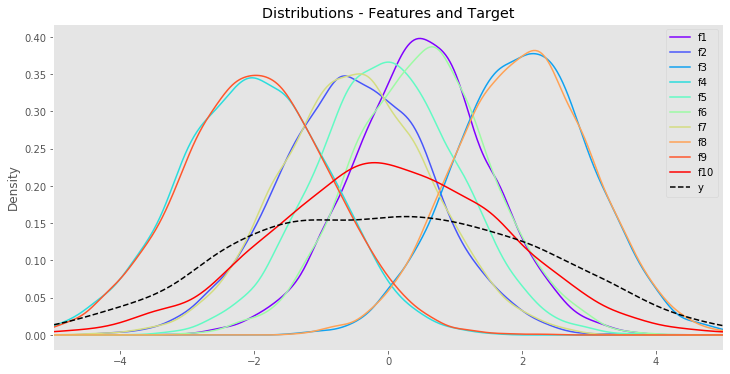

In [147]:
import matplotlib.cm as cm
colors = cm.rainbow(np.linspace(0, 1, 10))
## Distribution of features and target
#X.plot.kde(figsize(12,6),legend=True,xlim=(-5,5),color=['green']*5+['orange']*5,title='Distributions - Features and Target')
X.plot.kde(figsize(12,6),legend=True,xlim=(-5,5),color=colors,title='Distributions - Features and Target')
y.plot.kde(figsize(12,6),legend=True,linestyle='--',color='black') # target
plt.grid(False)
plt.show();

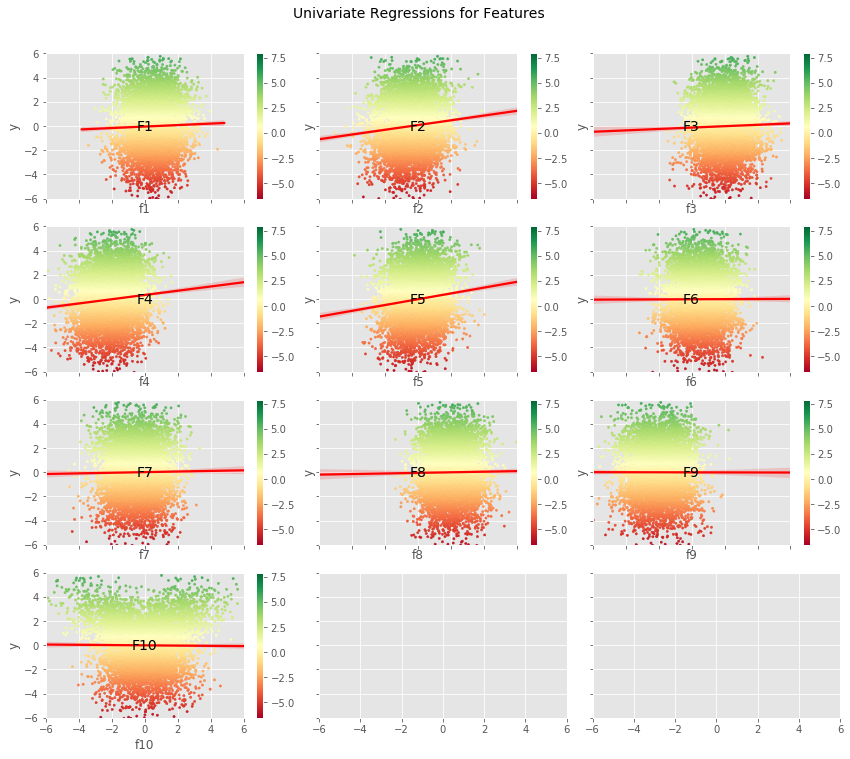

In [148]:
import scipy.stats as stats

# Set up the matplotlib figure
fig, axes = plt.subplots(4, 3, figsize=(12, 10), sharex=True, sharey=True)

# Rotate the starting point around the cubehelix hue circle
for ax, s in zip(axes.flat, range(10)):
    cmap = sns.cubehelix_palette(start=s, light=1, as_cmap=True)
    x = X.iloc[:,s]
    #sns.regplot(x, y,fit_reg = True, marker='.', scatter_kws={'s':5},ax=ax,color='salmon')
    points = ax.scatter(x, y, c=y, s=5, cmap="RdYlGn")
    plt.colorbar(points,ax=ax)
    sns.regplot(x, y, scatter=False, color="red",ax=ax)
    ax.set(xlim=(-6, 6), ylim=(-6, 6))
    ax.text(x=0,y=0,s=x.name.upper(),color='black',
            **{'ha': 'center', 'va': 'center', 'family': 'sans-serif'},fontsize=14)

fig.tight_layout()
fig.suptitle("Univariate Regressions for Features", y=1.05,fontsize=14)
plt.show();

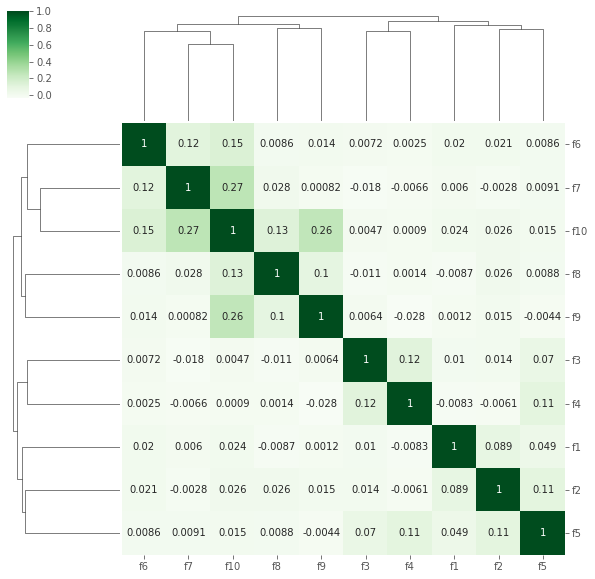

In [149]:
## Feature correlations

from scipy.cluster import hierarchy
from scipy.spatial import distance

corr_matrix = X.corr()
correlations_array = np.asarray(corr_matrix)
linkage = hierarchy.linkage(distance.pdist(correlations_array), \
                            method='average')

g = sns.clustermap(corr_matrix,row_linkage=linkage,col_linkage=linkage,\
                   row_cluster=True,col_cluster=True,figsize=(10,10),center=0.5, annot=True, fmt='.2g',cmap='Greens')
ax = g.ax_heatmap
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.setp(g.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()
label_order = corr_matrix.iloc[:,g.dendrogram_row.reordered_ind].columns

### Making Base Models
The first step in a stacked generalization system is to generate the "base models", meaning the models which are learning from our input features. We'll create two base models to use in our ensemble:

 **1.** A collection of simple linear regression models
 **2.** A collection of tree models - in this case, using the ExtraTrees algorithm

As described above it's absolutely critical to build models which provide realistic out-of-sample predictions, I am going to apply the methodology presented in Walk-forward modeling. In short, this will retrain at the end of each calendar quarter, using only data which would have been available at that time. Predictions are made using the most recently trained model.

To make this easier to follow, I'll define a simple function called make_walkforward_model that trains a series of models at various points in time and generates out of sample predictions using those trained models.

In [150]:
from sklearn.base import clone

def make_walkforward_model(features,outcome,algo=LinearRegression()):
    recalc_dates = features.resample('Q',level='Date').mean().index.values[:-1]
    
    ## Train models
    models = pd.Series(index=recalc_dates)
    for date in recalc_dates:    
        X_train = features.xs(slice(None,date),level='Date',drop_level=False)
        y_train = outcome.xs(slice(None,date),level='Date',drop_level=False)
        #print(f'Train with data prior to: {date} ({y_train.count()} obs)')
        
        model = clone(algo)
        model.fit(X_train,y_train)
        models.loc[date] = model

    begin_dates = models.index
    end_dates = models.index[1:].append(pd.to_datetime(['2099-12-31']))

    ## Generate OUT OF SAMPLE walk-forward predictions
    predictions = pd.Series(index=features.index)
    for i,model in enumerate(models): #loop thru each models object in collection
        #print(f'Using model trained on {begin_dates[i]}, Predict from: {begin_dates[i]} to: {end_dates[i]}')
        X = features.xs(slice(begin_dates[i],end_dates[i]),level='Date',drop_level=False)
        p = pd.Series(model.predict(X),index=X.index)
        predictions.loc[X.index] = p
    
    return models,predictions

To create a series of walk-forward models, simply pass in X and y data along with a scikit estimator object. It returns a series of models and a series of predictions. Here, we'll create two base models on all features, one using linear regression and one with extra trees.

In [151]:
from sklearn.ensemble import ExtraTreesRegressor

linear_models,linear_preds = make_walkforward_model(X,y,algo=LinearRegression())
tree_models,tree_preds = make_walkforward_model(X,y,algo=ExtraTreesRegressor())

Note that no predictions can be made prior to the first trained model, so it's important to dropna() on predictions prior to use.

In [152]:
print("Models:")
print(linear_models.head())
print()
print("Predictions:")
print(linear_preds.dropna().head())

Models:
2015-03-31    LinearRegression(copy_X=True, fit_intercept=Tr...
2015-06-30    LinearRegression(copy_X=True, fit_intercept=Tr...
2015-09-30    LinearRegression(copy_X=True, fit_intercept=Tr...
2015-12-31    LinearRegression(copy_X=True, fit_intercept=Tr...
2016-03-31    LinearRegression(copy_X=True, fit_intercept=Tr...
dtype: object

Predictions:
Date        symbol
2015-03-31  AAPL     -0.653530
            AMZN      0.393441
            CSCO     -0.242632
            MSFT     -0.572227
            PG       -0.502851
dtype: float64


It can be instructive to see how the linear model coefficients evolve over time:

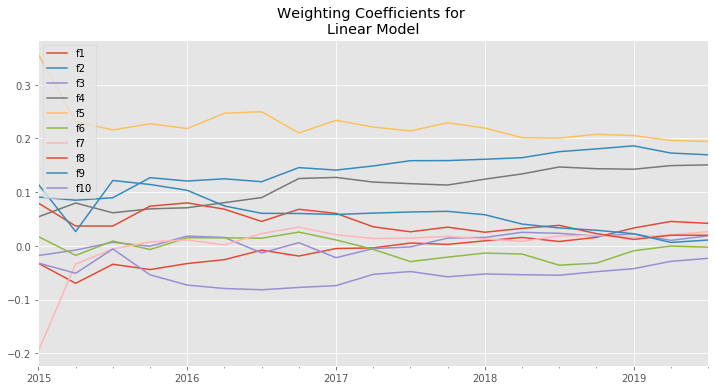

In [153]:
pd.DataFrame([model.coef_ for model in linear_models],
             columns=X.columns,index=linear_models.index).plot(figsize(12,6),title='Weighting Coefficients for \nLinear Model')
plt.show();

Next, I'll create a simple function to evaluate multiple model performance metrics, called calc_scorecard. Further detail on this method of model evaluation is provided in the earlier post Model evaluation.

In [154]:
from sklearn.metrics import r2_score,mean_absolute_error

def calc_scorecard(y_pred,y_true):
    
    def make_df(y_pred,y_true):
        y_pred.name = 'y_pred'
        y_true.name = 'y_true'

        df = pd.concat([y_pred,y_true],axis=1).dropna()

        df['sign_pred'] = df.y_pred.apply(np.sign)
        df['sign_true'] = df.y_true.apply(np.sign)
        df['is_correct'] = 0
        df.loc[df.sign_pred * df.sign_true > 0 ,'is_correct'] = 1 # only registers 1 when prediction was made AND it was correct
        df['is_incorrect'] = 0
        df.loc[df.sign_pred * df.sign_true < 0,'is_incorrect'] = 1 # only registers 1 when prediction was made AND it was wrong
        df['is_predicted'] = df.is_correct + df.is_incorrect
        df['result'] = df.sign_pred * df.y_true 
        return df
    
    df = make_df(y_pred,y_true)
    
    scorecard = pd.Series()
    # building block metrics
    scorecard.loc['RSQ'] = r2_score(df.y_true,df.y_pred)
    scorecard.loc['MAE'] = mean_absolute_error(df.y_true,df.y_pred)
    scorecard.loc['directional_accuracy'] = df.is_correct.sum()*1. / (df.is_predicted.sum()*1.)*100
    scorecard.loc['edge'] = df.result.mean()
    scorecard.loc['noise'] = df.y_pred.diff().abs().mean()
    # derived metrics
    scorecard.loc['edge_to_noise'] = scorecard.loc['edge'] / scorecard.loc['noise']
    scorecard.loc['edge_to_mae'] = scorecard.loc['edge'] / scorecard.loc['MAE']
    return scorecard    

calc_scorecard(y_pred=linear_preds,y_true=y).rename('Linear')

RSQ                      0.020928
MAE                      1.792012
directional_accuracy    53.699571
edge                     0.246217
noise                    0.413695
edge_to_noise            0.595165
edge_to_mae              0.137397
Name: Linear, dtype: float64

Since we are concerned about not only average performance but also period-to-period consistency, I'll create a simple wrapper function which recalculates our metrics by quarter.


scores_by_year

Date                  2017-12-31  2018-12-31  2019-12-31
RSQ                     0.028425    0.028176    0.019886
MAE                     1.780999    1.817719    1.819156
directional_accuracy   54.183267   54.023904   53.881279
edge                    0.287166    0.294490    0.239379
noise                   0.404181    0.399139    0.438991
edge_to_noise           0.710488    0.737814    0.545294
edge_to_mae             0.161239    0.162011    0.131588



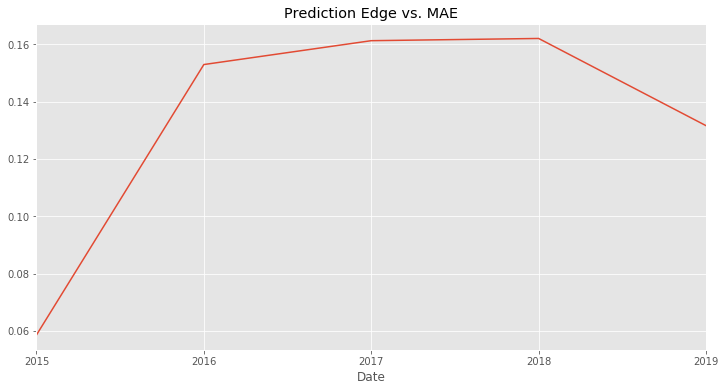

In [155]:
def scores_over_time(y_pred,y_true):
    df = pd.concat([y_pred,y_true],axis=1).dropna().reset_index().set_index('Date')
    scores = df.resample('A').apply(lambda df: calc_scorecard(df[y_pred.name],df[y_true.name]))
    return scores

scores_by_year = scores_over_time(y_pred=linear_preds,y_true=y)
print('')
print('scores_by_year')
print('')
print(scores_by_year.tail(3).T)
print('')
scores_by_year['edge_to_mae'].plot(title='Prediction Edge vs. MAE')
plt.show();

### Making the Ensemble Model
Now that we've trained base models and generated out-of-sample predictions, it's time to train the stacked generalization ensemble model.

Training the ensemble model simply requires feeding in the base models' predictions in as the X dataframe. To clean up the data and ensure the X and y are of compatible dimensions, I've created a short data preparation function.

Here, we'll use Lasso to train the ensemble becuase it is one of a few linear models which can be constrained to positive = True. This will ensure that the ensemble will assign either a positive or zero weight to each model, for reasons described above.

In [156]:
from sklearn.linear_model import LassoCV

def prepare_Xy(X_raw,y_raw):
    ''' Utility function to drop any samples without both valid X and y values'''
    Xy = X_raw.join(y_raw).replace({np.inf:None,-np.inf:None}).dropna()
    X = Xy.iloc[:,:-1]
    y = Xy.iloc[:,-1]
    return X,y
X_ens, y_ens = prepare_Xy(X_raw=pd.concat([linear_preds.rename('linear'),tree_preds.rename('tree')],
                                          axis=1),y_raw=y)

ensemble_models,ensemble_preds = make_walkforward_model(X_ens,y_ens,algo=LassoCV(positive=True))
ensemble_preds = ensemble_preds.rename('ensemble')
print(ensemble_preds.dropna().head())

Date        symbol
2015-03-31  AAPL     -0.496073
            AMZN      0.648839
            CSCO     -0.586862
            MSFT      0.369889
            PG        3.253538
Name: ensemble, dtype: float64


Note that the ensemble's predictions don't begin until July, since the earliest trained ensemble model isn't available until end of Q2. This is necessary to make sure the ensemble model is trained on out of sample data - and that its predictions are also out of sample.

Again, we can look at the coefficients over time of the ensemble model. Keep in mind that the coefficients of the ensemble model represents how much weight is being given to each base model. In this case, it appears that our tree model is much more useful relative to the linear model, though the linear model is gradually catching up.

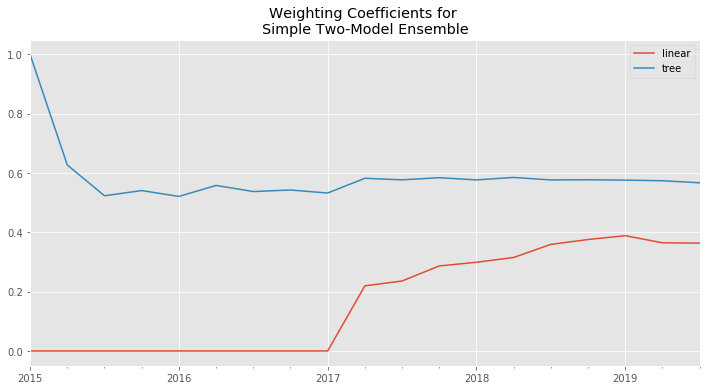

In [157]:
pd.DataFrame([model.coef_ for model in ensemble_models],
             columns=X_ens.columns,index=ensemble_models.index).plot(title='Weighting Coefficients for \nSimple Two-Model Ensemble')
plt.show();

### Performance of Ensemble vs. Base Models
Now that we have predictions from both the base models and ensemble model, we can explore how the ensemble performs relative to base models. Is the whole really more than the sum of the parts?

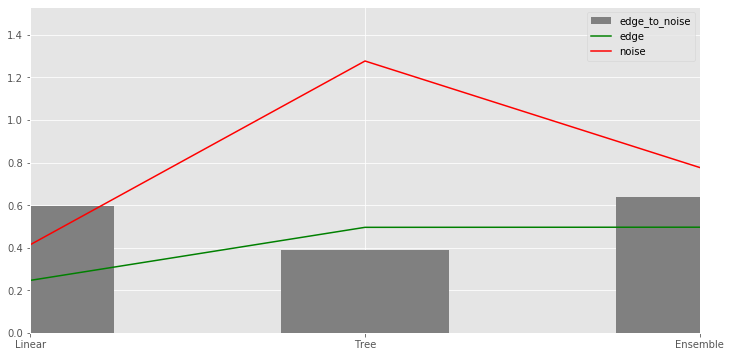

                         Linear       Tree   Ensemble
RSQ                    0.020928   0.055026   0.098294
MAE                    1.792012   1.720521   1.704685
directional_accuracy  53.699571  58.849785  58.592275
edge                   0.246217   0.495475   0.496066
noise                  0.413695   1.276815   0.776378
edge_to_noise          0.595165   0.388055   0.638948
edge_to_mae            0.137397   0.287980   0.291001


In [158]:
# calculate scores for each model
score_ens = calc_scorecard(y_pred=ensemble_preds,y_true=y_ens).rename('Ensemble')
score_linear = calc_scorecard(y_pred=linear_preds,y_true=y_ens).rename('Linear')
score_tree = calc_scorecard(y_pred=tree_preds,y_true=y_ens).rename('Tree')


scores = pd.concat([score_linear,score_tree,score_ens],axis=1)
scores.loc['edge_to_noise'].plot.bar(color='grey',legend=True)
scores.loc['edge'].plot(color='green',legend=True)
scores.loc['noise'].plot(color='red',legend=True)

plt.margins(0.2)
plt.show()
print(scores)

### Observations: 

The tree model is relatively high accuracy and high "edge" - but it's very noisy (i.e., its predictions swing wildly from day to day, making it difficult to trade).  The linear model has lower accuracy & edge, but is much less noisy. * Ensembling the two models together preserves the accuracy of the tree model but cuts the prediction noise nearly in half. * While not the most meaningful measurement metric, it's amazing to see the ensemble's RSQ more than doubled the better of the two base models. In real-world trading, it's also very important to understand how consistenly perform, and if performance is trending better or worse. Below, we'll plot four of the performance statistics by year across time

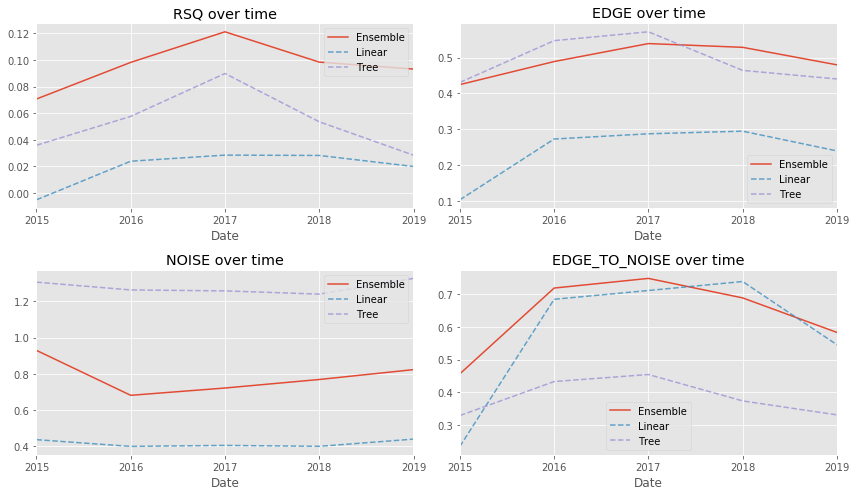

In [159]:
fig,[[ax1,ax2],[ax3,ax4]] = plt.subplots(2,2,figsize=(12,7))

metric = 'RSQ'
scores_over_time(y_pred=ensemble_preds.rename('ensemble'),y_true=y)[metric].rename('Ensemble').\
plot(title=f'{metric.upper()} over time',legend=True,ax=ax1)
scores_over_time(y_pred=linear_preds.rename('linear'),y_true=y)[metric].rename('Linear').\
plot(title=f'{metric.upper()} over time',legend=True, alpha = 0.75, linestyle='--',ax=ax1)
scores_over_time(y_pred=tree_preds.rename('tree'),y_true=y)[metric].rename("Tree").\
plot(title=f'{metric.upper()} over time',legend=True, alpha = 0.75, linestyle='--',ax=ax1)

metric = 'edge'
scores_over_time(y_pred=ensemble_preds.rename('ensemble'),y_true=y)[metric].rename('Ensemble').\
plot(title=f'{metric.upper()} over time',legend=True,ax=ax2)
scores_over_time(y_pred=linear_preds.rename('linear'),y_true=y)[metric].rename('Linear').\
plot(title=f'{metric.upper()} over time',legend=True, alpha = 0.75, linestyle='--',ax=ax2)
scores_over_time(y_pred=tree_preds.rename('tree'),y_true=y)[metric].rename("Tree").\
plot(title=f'{metric.upper()} over time',legend=True, alpha = 0.75, linestyle='--',ax=ax2)

metric = 'noise'
scores_over_time(y_pred=ensemble_preds.rename('ensemble'),y_true=y)[metric].rename('Ensemble').\
plot(title=f'{metric.upper()} over time',legend=True,ax=ax3)
scores_over_time(y_pred=linear_preds.rename('linear'),y_true=y)[metric].rename('Linear').\
plot(title=f'{metric.upper()} over time',legend=True, alpha = 0.75, linestyle='--',ax=ax3)
scores_over_time(y_pred=tree_preds.rename('tree'),y_true=y)[metric].rename("Tree").\
plot(title=f'{metric.upper()} over time',legend=True, alpha = 0.75, linestyle='--',ax=ax3)

metric = 'edge_to_noise'
scores_over_time(y_pred=ensemble_preds.rename('ensemble'),y_true=y)[metric].rename('Ensemble').\
plot(title=f'{metric.upper()} over time',legend=True,ax=ax4)
scores_over_time(y_pred=linear_preds.rename('linear'),y_true=y)[metric].rename('Linear').\
plot(title=f'{metric.upper()} over time',legend=True, alpha = 0.75, linestyle='--',ax=ax4)
scores_over_time(y_pred=tree_preds.rename('tree'),y_true=y)[metric].rename("Tree").\
plot(title=f'{metric.upper()} over time',legend=True, alpha = 0.75, linestyle='--',ax=ax4)

plt.tight_layout()
plt.show()

### Observations:
 - We can see that the ensemble is fairly consistently more effective than either of the base models.
 - All models seem to be getting better over time (and as they have more data on which to train).
 - The ensemble also appears to be a bit more consistent over time. Much like a diversified portfolio of stocks should be less volatile than the individual stocks within it, an ensemble of diverse models will often perform more consistently across time

### Next Steps
The stacked generalization methodology is highly flexible. There are countless directions you can take this, including:

 - **More model types:** add SVMs, deep learning models, regularlized regressions, and dimensionality reduction models to the mix
 - **More hyperparameter combinations:** try multiple sets of hyperparameters on a particular algorithm.
 - **Orthogonal feature sets:** try training base models on different subsets of features. Avoid the "curse of dimensionality" by limiting each base model to an appropriately small number of features.

In [160]:
ensemble_preds

Date        symbol
2015-03-31  AAPL     -0.496073
            AMZN      0.648839
            CSCO     -0.586862
            MSFT      0.369889
            PG        3.253538
                        ...   
2019-11-12  AAPL      0.920804
            AMZN     -0.555394
            CSCO     -0.164420
            MSFT     -0.549560
            PG        0.970075
Name: y_pred, Length: 5825, dtype: float64

In [161]:
non_predictive_factor_data = alphalens.utils.get_clean_factor_and_forward_returns(ensemble_preds, 
                                                                                  close_df, 
                                                                                  quantiles=4,
                                                                                  bins=None)

Dropped 0.9% entries from factor data: 0.9% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!


In [162]:
non_predictive_factor_data

1D        5D       10D    factor  factor_quantile
date       asset                                                         
2015-03-31 AAPL  -0.001447  0.009403  0.018886 -0.496073                1
           AMZN  -0.004945  0.024456  0.030503  0.648839                3
           CSCO  -0.010171  0.000726  0.026153 -0.586862                1
           MSFT   0.001476  0.018692  0.039351  0.369889                2
           PG     0.004638  0.010129  0.019160  3.253538                4
...                    ...       ...       ...       ...              ...
2019-10-29 AAPL  -0.000123  0.056887  0.076740  1.473740                4
           AMZN   0.009803  0.022125  0.008674  0.328286                1
           CSCO   0.006774  0.011008  0.023920 -0.036830                1
           MSFT   0.012462  0.011412  0.029686  0.340758                2
           PG     0.010841 -0.038026 -0.035032  1.215602                3

[5775 rows x 5 columns]

Quantiles Statistics


,min,max,mean,std,count,count %
factor_quantile,,,,,,
1,-3.560003,0.773456,-0.521642,0.459137,2310,40.0
2,-1.791502,1.521772,-0.011013,0.367812,1155,20.0
3,-1.252787,2.629310,0.339629,0.438256,1155,20.0
4,-0.511173,3.268569,0.890264,0.613084,1155,20.0


Returns Analysis


,1D,5D,10D
Ann. alpha,0.008,0.017,0.004
beta,-0.028,0.004,-0.002
Mean Period Wise Return Top Quantile (bps),1.784,0.437,-0.396
Mean Period Wise Return Bottom Quantile (bps),1.650,-0.468,-0.390
Mean Period Wise Spread (bps),0.134,0.632,-0.290


<Figure size 864x432 with 0 Axes>

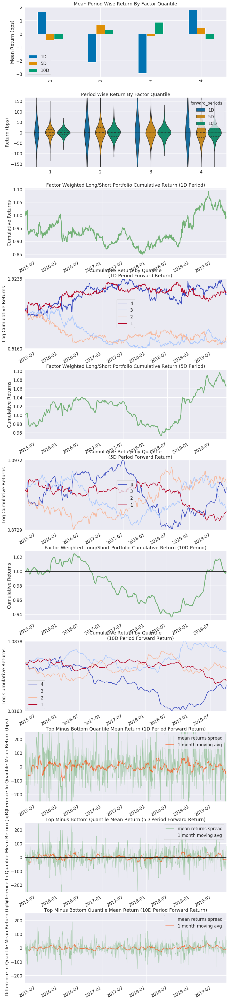

Information Analysis


,1D,5D,10D
IC Mean,-0.007,-0.011,-0.009
IC Std.,0.507,0.498,0.489
Risk-Adjusted IC,-0.015,-0.022,-0.019
t-stat(IC),-0.499,-0.739,-0.650
p-value(IC),0.618,0.460,0.516
IC Skew,0.014,0.053,-0.004
IC Kurtosis,-0.849,-0.912,-0.841


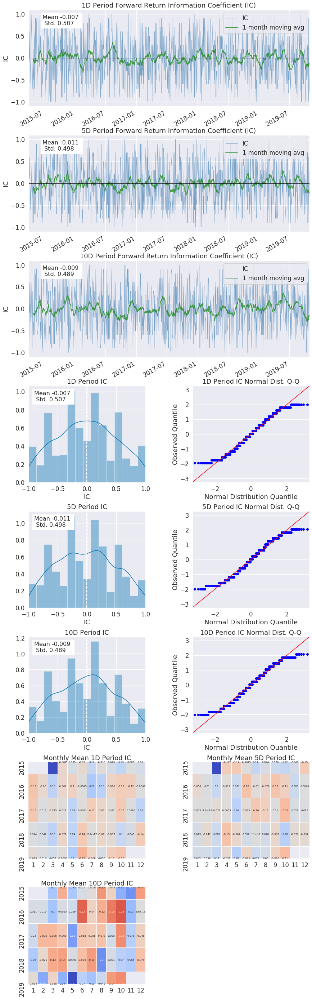

Turnover Analysis


,10D,1D,5D
Quantile 1 Mean Turnover,0.606,0.589,0.610
Quantile 2 Mean Turnover,0.796,0.789,0.801
Quantile 3 Mean Turnover,0.797,0.791,0.813
Quantile 4 Mean Turnover,0.822,0.783,0.803


,1D,5D,10D
Mean Factor Rank Autocorrelation,0.01,-0.024,-0.011


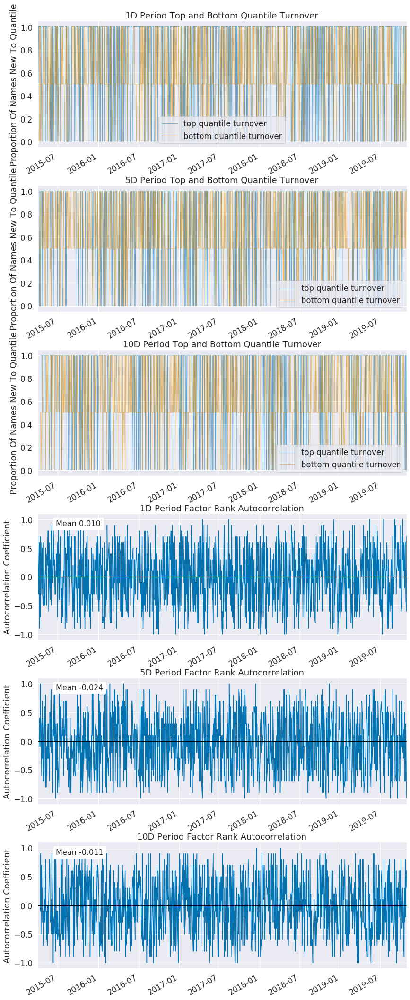

In [163]:
alphalens.tears.create_full_tear_sheet(non_predictive_factor_data)

<Figure size 864x432 with 0 Axes>

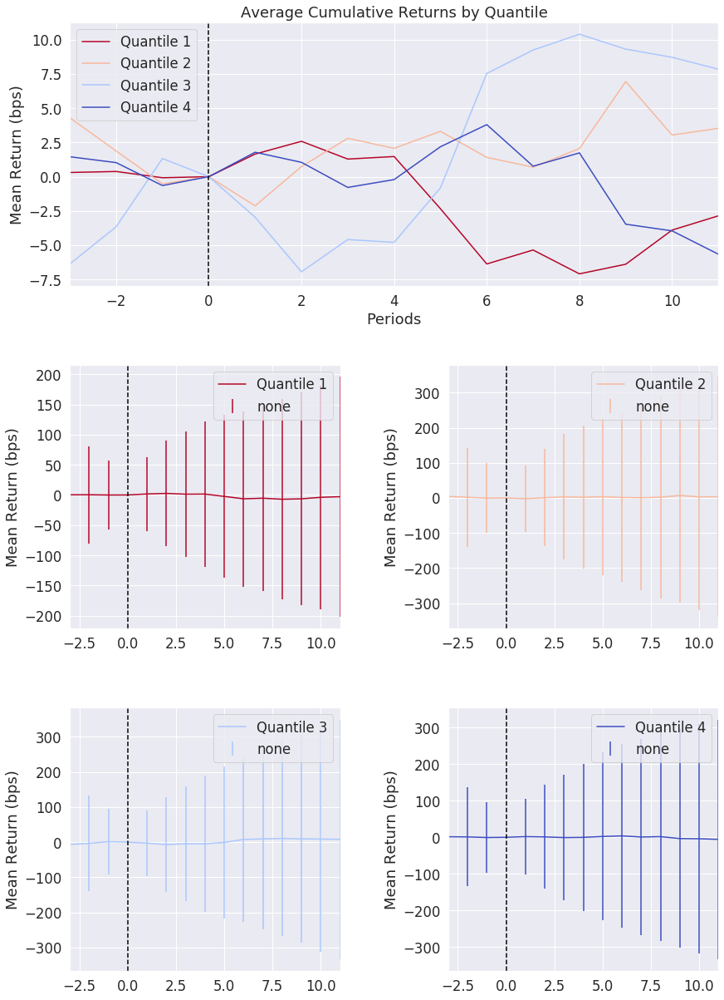

In [164]:
alphalens.tears.create_event_returns_tear_sheet(non_predictive_factor_data, close_df, avgretplot=(3, 11),
                                long_short=True, group_neutral=False, by_group=False)
plt.show()

In [223]:
from alphalens.performance import mean_information_coefficient
from alphalens.utils import get_clean_factor_and_forward_returns
from alphalens.tears import create_information_tear_sheet, create_returns_tear_sheet

In [224]:
df.head()

f11       f12       f13       f21       f22       f23  \
date       asset                                                               
2015-01-02 AAPL  -0.545693  1.167614  1.963140 -0.897810  1.058136  0.937797   
           AMZN   1.650598  0.568624  0.724730  0.034701  0.165911 -0.461123   
           CSCO  -0.413100 -0.726912 -1.553553 -0.786826 -1.515939 -1.700534   
           MSFT   0.792430  0.912104  1.045157 -0.971750  1.542988  0.062156   
           PG    -0.850152 -0.425334  0.453753  0.283462  1.764732  0.795777   

                       f31       f32       f33       f41       f42       f43  \
date       asset                                                               
2015-01-02 AAPL   0.157261 -1.105603 -0.654023 -0.557452  0.483224  0.707973   
           AMZN  -0.494175 -1.227514 -1.307764  0.761959 -0.672637 -0.085781   
           CSCO  -0.018566 -0.237581 -0.345090 -1.684136  0.508640 -0.590444   
           MSFT  -0.268628 -0.761618  0.126231  0.327092  1.327839  2.486998   
           PG    -1.288635 -0.745242 -1.000715 -0.789512  1.397540 -1.707861   

                       f51       f52       f53  
date       asset                                
2015-01-02 AAPL   0.261426  0.768604  0.685165  
           AMZN   0.120966 -2.773158 -0.316103  
           CSCO   0.067706 -1.310393 -0.013011  
           MSFT  -0.491095 -0.055099  0.109693  
           PG    -0.491711  1.255827 -0.819294

In [225]:
df_ab_10_13 = []
df_ic_10_13 = []
df_mu_10_13 = []
cols_10_13 = []

for col in df.columns:
    try:
        factor_data = get_clean_factor_and_forward_returns(df[col], close_df)
    except:
        print('Some problem with %s' % col)
        continue
    
    cols_10_13.append(col)
    ab = alphalens.performance.factor_alpha_beta(factor_data)
    ic = alphalens.performance.mean_information_coefficient(factor_data)
    
    # replicate what the full tearsheet shows under "Returns Analysis"
    DECIMAL_TO_BPS = 10000
    mu, sigma = alphalens.performance.mean_return_by_quantile(factor_data)
    mu = mu.apply(alphalens.utils.rate_of_return, axis=0, base_period=mu.columns[0])
    topbot = (mu * DECIMAL_TO_BPS).iloc[[-1, 0]]
    
    df_ab_10_13.append(ab)
    df_ic_10_13.append(ic)
    df_mu_10_13.append(topbot)

Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Dropped 0.8% entries from factor data: 0.8% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Dropped 0.8% en

In [226]:
fs = (12, 8)

def plot_top_bot_10_13(period='10D'):
    df0 = pd.DataFrame([df.loc[1, period] for df in df_mu_10_13], index=cols_10_13, columns=['Bottom quantile_10_13'])
    df1 = pd.DataFrame([df.loc[5, period] for df in df_mu_10_13], index=cols_10_13, columns=['Top quantile_10_13'])
    df = pd.concat((df0, df1), 1)
    df.plot(kind='barh', title='Mean %s Returns (bps) for top & bottom quantiles_10_13 ' % period, figsize=fs, alpha = 0.75);
    return df

In [227]:
longest_look_forward_period = 30 # Common time periods: week = 5, month = 21, quarter = 63, year = 252

range_step = 5 # A larger number here makes things run faster, but makes the resulting chart less precise

# We will populate this empty dataframe with IC Mean data
factor_ic_decay_16_19 = pd.DataFrame()

i = 0

for factor_name in df.columns:
    
    # Excludes the 'sector' column in pipeline_output
    if i == 0:
        
        try:
        
            # Gets the IC decay for each factor
            asset_factor_data = get_clean_factor_and_forward_returns(
            factor = df[factor_name],
            prices = close_df,
            periods = range(1, longest_look_forward_period, range_step)
            )
            factor_ic_decay_16_19[factor_name] = mean_information_coefficient(asset_factor_data)
        
        except:
            print('Some problem with %s' % factor_name)
            continue

Dropped 2.1% entries from factor data: 2.1% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Dropped 2.1% entries from factor data: 2.1% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Dropped 2.1% entries from factor data: 2.1% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Dropped 2.1% entries from factor data: 2.1% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Dropped 2.1% entries from factor data: 2.1% in forward returns computation and 0.0% in binning phase (set max_loss=0 to see potentially suppressed Exceptions).
max_loss is 35.0%, not exceeded: OK!
Dropped 2.1% en

In [228]:
df_ic_10_13x = pd.concat(df_ic_10_13, 1)
df_ic_10_13x.columns = cols_10_13

In [244]:
dfx_10_13 = plot_top_bot_10_13(period='10D')
plt.close()

In [230]:
dfx_10_13['abs_diff_10_13'] = np.abs(dfx_10_13.iloc[:,1] - dfx_10_13.iloc[:,0])

In [231]:
df1013t = dfx_10_13.copy()
df1013t = df1013t.drop('abs_diff_10_13', axis=1)
df1013t = df1013t.drop('Top quantile_10_13', axis=1)

In [232]:
df1013b = dfx_10_13.copy()
df1013b = df1013b.drop('abs_diff_10_13', axis=1)
df1013b = df1013b.drop('Bottom quantile_10_13', axis=1)

In [233]:
df1013d = dfx_10_13.copy()
df1013d = df1013d.drop('Bottom quantile_10_13', axis=1)
df1013d = df1013d.drop('Top quantile_10_13', axis=1)
df1013d = df1013d.sort_values('abs_diff_10_13',ascending=False)

In [234]:
df_ic1013=factor_ic_decay_16_19.loc['21D']
df_ic1013= pd.DataFrame(df_ic1013)
df_ic01013 = df_ic1013.sort_values('21D',ascending=False)
df_ic01013['10D ABS Diff'] = df1013d['abs_diff_10_13']
df_ic21013 = df_ic01013.sort_values('10D ABS Diff',ascending=False)

In [235]:
dfx21 = df_ic21013.copy()
dfx21 = dfx21.drop('10D ABS Diff', axis=1)
dfx21.columns = ['21D IC Mean_10_13']

In [236]:
abs_diff_10_13 = pd.DataFrame(df1013d['abs_diff_10_13'])
abs_diff_10_13.columns = ['abs_diff_10_13']
abs_diff_10_13 = abs_diff_10_13.sort_values('abs_diff_10_13',ascending=False)

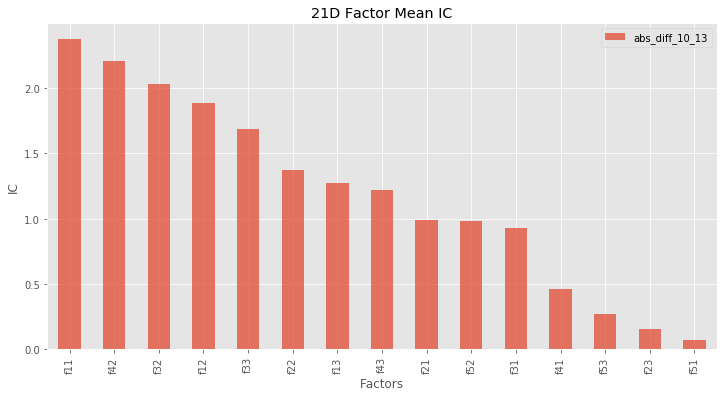

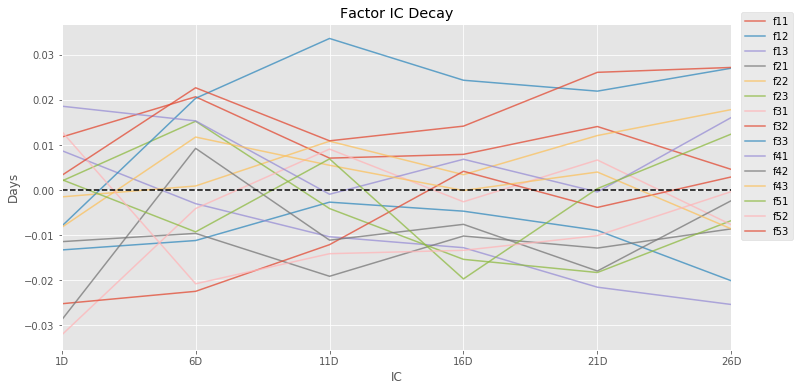

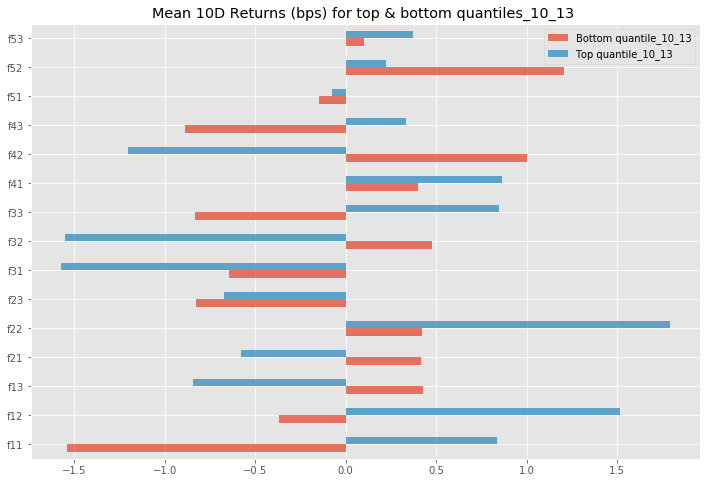

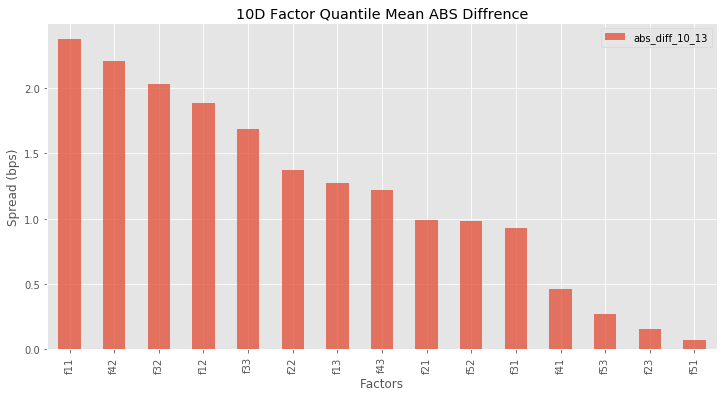

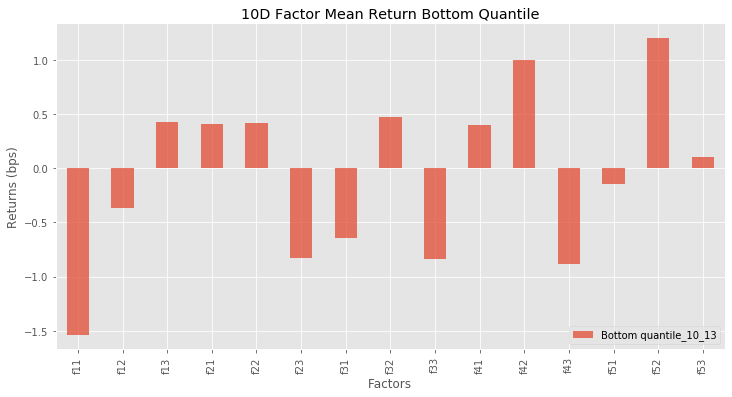

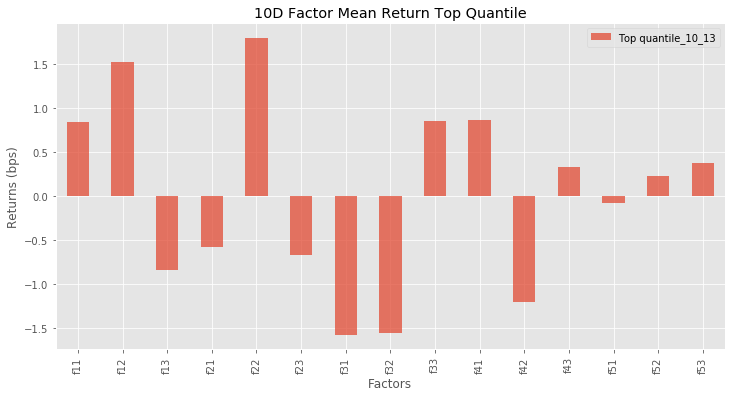

In [245]:
abs_diff_10_13.plot(kind='bar', alpha = 0.75, figsize=(12,6))
plt.title('21D Factor Mean IC')
plt.xlabel('Factors')
plt.ylabel('IC')

factor_ic_decay_16_19.plot(figsize(12,6),title='Factor IC Decay', alpha = 0.75)
plt.axhline(0, color='black', linewidth=1.5, linestyle='dashed')
plt.xlabel('IC')
plt.ylabel('Days')
plt.legend(bbox_to_anchor=(1.1, 1.05))

dfx_10_13 = plot_top_bot_10_13(period='10D')

df1013d.plot(kind='bar', figsize=(12,6), alpha = 0.75)
plt.title('10D Factor Quantile Mean ABS Diffrence')
plt.xlabel('Factors')
plt.ylabel('Spread (bps)')
plt.legend(loc='upper right')

df1013t.plot(kind='bar', figsize=(12,6), alpha = 0.75)
plt.title('10D Factor Mean Return Bottom Quantile')
plt.xlabel('Factors')
plt.ylabel('Returns (bps)')
plt.legend(loc='lower right')

df1013b.plot(kind='bar', figsize=(12,6), alpha = 0.75)
plt.title('10D Factor Mean Return Top Quantile')
plt.xlabel('Factors')
plt.ylabel('Returns (bps)')
plt.legend(loc='upper right')

plt.show();

In [238]:
import pyfolio as pf

In [239]:
pf_returns, pf_positions, pf_benchmark = \
    alphalens.performance.create_pyfolio_input(non_predictive_factor_data,
                                               period='1D',
                                               capital=100000,
                                               long_short=True,
                                               group_neutral=False,
                                               equal_weight=True,
                                               quantiles=[1,5],
                                               groups=None,
                                               benchmark_period='1D')

Start date,2015-01-02
End date,2019-10-30
Total months,83
,Backtest
Annual return,3.1%
Cumulative returns,23.4%
Annual volatility,11.2%
Sharpe ratio,0.32
Calmar ratio,0.19
Stability,0.31
Max drawdown,-16.5%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,16.46,2016-07-20,2018-03-26,2018-10-19,588
1,16.15,2018-10-29,2019-04-26,2019-10-15,252
2,14.37,2015-09-30,2016-02-02,2016-03-15,120
3,13.87,2015-01-21,2015-01-30,2015-04-28,70
4,7.12,2015-05-05,2015-08-13,2015-09-29,106


Stress Events,mean,min,max
Fall2015,0.16%,-1.35%,1.86%
New Normal,0.01%,-7.66%,6.83%


Top 10 long positions of all time,max
asset,
AAPL,50.00%
AMZN,50.00%
CSCO,50.00%
MSFT,50.00%
PG,50.00%


Top 10 short positions of all time,max
asset,
AAPL,-50.00%
AMZN,-50.00%
CSCO,-50.00%
MSFT,-50.00%
PG,-50.00%


Top 10 positions of all time,max
asset,
AAPL,50.00%
AMZN,50.00%
CSCO,50.00%
MSFT,50.00%
PG,50.00%


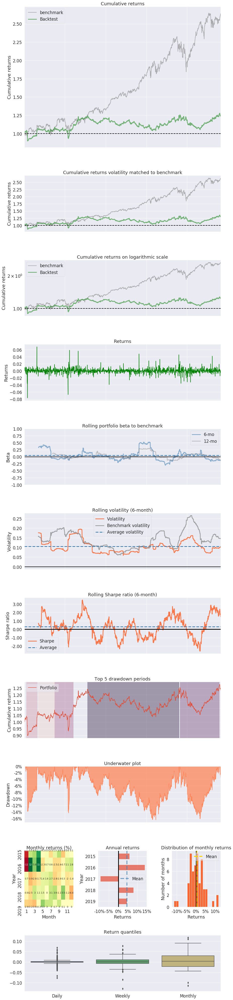

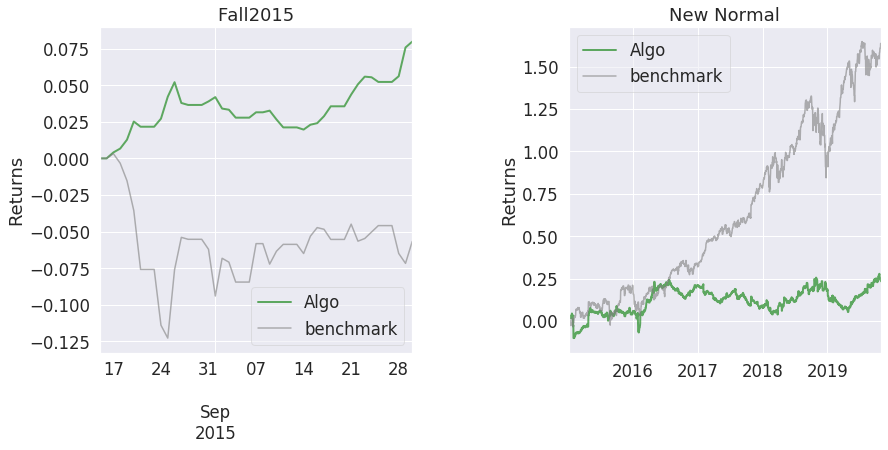

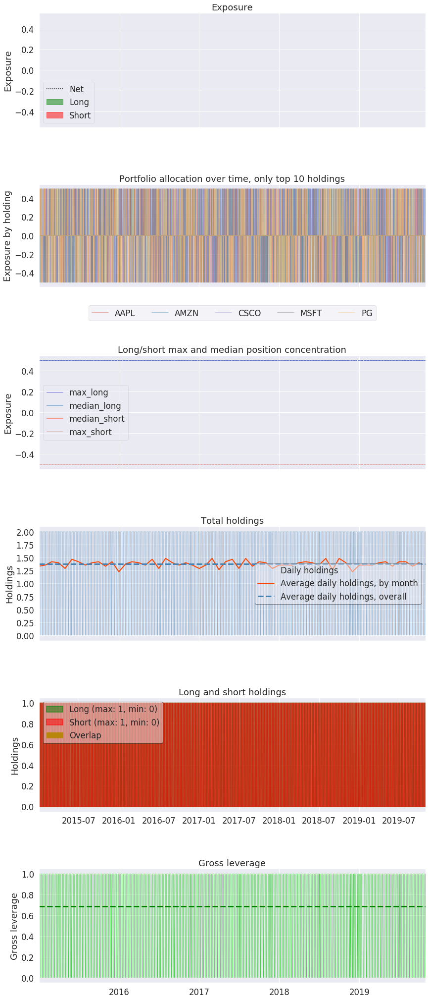

In [241]:
pyfolio.tears.create_full_tear_sheet(pf_returns,
                                     positions=pf_positions,
                                     benchmark_rets=pf_benchmark,
                                     round_trips=True)